## Assignment 3 - Supervised Learning

In [0]:
import pyspark.sql.functions as F

### Import annual data and join

In [0]:
# File location and type
file_location = "/FileStore/tables/annual_features.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
annual_features = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

#display
annual_features.display()

customer_id,ann_txn_amt_max_2011,ann_txn_amt_max_2012,ann_txn_amt_max_2013,ann_txn_amt_max_2014,ann_txn_amt_max_2015,ann_txn_amt_mean_2011,ann_txn_amt_mean_2012,ann_txn_amt_mean_2013,ann_txn_amt_mean_2014,ann_txn_amt_mean_2015,ann_txn_amt_min_2011,ann_txn_amt_min_2012,ann_txn_amt_min_2013,ann_txn_amt_min_2014,ann_txn_amt_min_2015,ann_txn_amt_sem_2011,ann_txn_amt_sem_2012,ann_txn_amt_sem_2013,ann_txn_amt_sem_2014,ann_txn_amt_sem_2015,ann_txn_amt_std_2011,ann_txn_amt_std_2012,ann_txn_amt_std_2013,ann_txn_amt_std_2014,ann_txn_amt_std_2015,ann_txn_amt_sum_2011,ann_txn_amt_sum_2012,ann_txn_amt_sum_2013,ann_txn_amt_sum_2014,ann_txn_amt_sum_2015,ann_txn_amt_var_2011,ann_txn_amt_var_2012,ann_txn_amt_var_2013,ann_txn_amt_var_2014,ann_txn_amt_var_2015,ann_txn_cnt_2011,ann_txn_cnt_2012,ann_txn_cnt_2013,ann_txn_cnt_2014,ann_txn_cnt_2015
CS1112,96,81,105,90,39,70.66666667,67.4,70.66666667,70.66666667,39.0,56,52,36,59,39,12.71918935,5.688585061,19.91928156,9.735387911,0.0,22.03028219,12.72006289,34.50120771,16.86218649,0.0,212,337,212,212,39,485.3333333,161.8,1190.333333,284.3333333,0.0,3,5,3,3,1
CS1113,94,95,97,97,98,81.33333333,74.8,85.2,56.5,73.33333333,57,51,65,36,44,12.17009084,7.618398782,5.851495535,13.97915114,15.76212056,21.07921567,17.03525756,13.08434179,27.95830229,27.30079364,244,374,426,226,220,444.3333333,290.2,171.2,781.6666667,745.3333333,3,5,5,4,3
CS1114,97,97,105,95,79,85.2,75.0,70.4,70.83333333,79.0,76,53,43,37,79,4.352011029,22.0,11.12924076,11.00126255,0.0,9.731392501,31.11269837,24.88573889,26.94747978,0.0,426,150,352,425,79,94.7,968.0,619.3,726.1666667,0.0,5,2,5,6,1
CS1115,102,104,94,98,55,87.0,67.57142857,79.57142857,78.25,55.0,72,41,66,50,55,8.660254038,8.257340581,3.981248565,11.3164703,0.0,15.0,21.84686967,10.53339361,22.6329406,0.0,261,473,557,313,55,225.0,477.2857143,110.952381,512.25,0.0,3,7,7,4,1
CS1116,87,105,59,96,0,58.75,76.66666667,59.0,66.6,0.0,41,45,59,40,0,10.60169012,17.40051085,0.0,11.28538878,0.0,21.20338023,30.13856887,0.0,25.23489647,0.0,235,230,59,333,0,449.5833333,908.3333333,0.0,636.8,0.0,4,3,1,5,0
CS1117,98,100,94,94,0,71.0,65.33333333,69.4,71.5,0.0,46,35,49,56,0,15.0443788,18.88856209,7.775602871,6.47945471,0.0,26.05762844,32.71594922,17.38677658,15.87135785,0.0,213,196,347,429,0,679.0,1070.333333,302.3,251.9,0.0,3,3,5,6,0
CS1118,81,63,77,101,60,62.0,63.0,72.0,68.88888889,60.0,43,63,67,41,60,19.0,0.0,5.0,7.855366963,0.0,26.87005769,0.0,7.071067812,23.56610089,0.0,124,63,144,620,60,722.0,0.0,50.0,555.3611111,0.0,2,1,2,9,1
CS1119,0,102,99,93,59,0.0,82.2,79.66666667,74.83333333,59.0,0,35,49,36,59,0.0,12.21228889,15.50627113,8.795516535,0.0,0.0,27.30750813,26.85764944,21.54452753,0.0,0,411,239,449,59,0.0,745.7,721.3333333,464.1666667,0.0,0,5,3,6,1
CS1120,105,96,100,75,84,82.0,70.4,72.57142857,75.0,55.33333333,53,50,45,75,41,10.0895986,8.663717447,8.839460075,0.0,6.458413978,22.56102835,19.37266115,23.38701308,0.0,15.81981879,410,352,508,75,332,509.0,375.3,546.952381,0.0,250.2666667,5,5,7,1,6
CS1121,102,104,88,73,37,72.0,61.3,56.6,50.5,37.0,40,35,38,38,37,16.01561738,7.163255002,9.37869927,5.296225071,0.0,32.03123476,22.65220127,20.97140911,12.97304899,0.0,288,613,283,303,37,1026.0,513.1222222,439.8,168.3,0.0,4,10,5,6,1


In [0]:
# File location and type
file_location = "/FileStore/tables/annual_day_of_week_counts_pivot.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
annual_day_of_week_counts_pivot = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

#display
annual_day_of_week_counts_pivot.display()

customer_id,cnt_2011_Friday,cnt_2011_Monday,cnt_2011_Saturday,cnt_2011_Sunday,cnt_2011_Thursday,cnt_2011_Tuesday,cnt_2011_Wednesday,cnt_2012_Friday,cnt_2012_Monday,cnt_2012_Saturday,cnt_2012_Sunday,cnt_2012_Thursday,cnt_2012_Tuesday,cnt_2012_Wednesday,cnt_2013_Friday,cnt_2013_Monday,cnt_2013_Saturday,cnt_2013_Sunday,cnt_2013_Thursday,cnt_2013_Tuesday,cnt_2013_Wednesday,cnt_2014_Friday,cnt_2014_Monday,cnt_2014_Saturday,cnt_2014_Sunday,cnt_2014_Thursday,cnt_2014_Tuesday,cnt_2014_Wednesday,cnt_2015_Friday,cnt_2015_Monday,cnt_2015_Saturday,cnt_2015_Sunday,cnt_2015_Thursday,cnt_2015_Tuesday,cnt_2015_Wednesday
CS1112,1,0,0,1,0,0,1,0,0,1,3,0,1,0,1,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,1
CS1113,1,1,0,1,0,0,0,2,1,0,0,0,1,1,0,1,1,0,0,2,1,0,0,1,0,0,3,0,0,2,0,0,0,0,1
CS1114,0,1,0,1,1,0,2,0,0,1,1,0,0,0,0,1,0,1,2,0,1,1,1,1,1,0,1,1,0,0,0,0,1,0,0
CS1115,0,0,1,1,0,0,1,1,1,0,2,1,1,1,0,1,2,0,2,0,2,0,0,0,0,2,0,2,0,0,0,0,1,0,0
CS1116,1,1,0,0,1,1,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,3,1,0,1,0,0,0,0,0,0,0,0,0,0
CS1117,1,0,0,0,1,0,1,1,1,0,0,0,0,1,0,2,0,3,0,0,0,0,0,1,1,1,2,1,0,0,0,0,0,0,0
CS1118,0,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,2,0,3,0,2,1,0,0,1,0,0,0,0
CS1119,0,0,0,0,0,0,0,0,0,0,1,1,1,2,0,0,0,0,1,1,1,2,1,1,0,0,0,2,0,0,0,0,1,0,0
CS1120,1,1,1,0,2,0,0,1,0,0,1,1,1,1,1,1,1,0,1,2,1,0,1,0,0,0,0,0,3,1,2,0,0,0,0
CS1121,0,1,0,0,2,1,0,1,1,1,4,1,1,1,4,0,0,0,0,1,0,0,1,0,2,2,1,0,0,0,0,0,0,1,0


In [0]:
# File location and type
file_location = "/FileStore/tables/Retail_Data_Response.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
Retail_Data_Response = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

#display
Retail_Data_Response.display()

customer_id,response
CS1112,0
CS1113,0
CS1114,1
CS1115,1
CS1116,1
CS1117,0
CS1118,1
CS1119,0
CS1120,0
CS1121,0


In [0]:
merged_df = annual_features.join(annual_day_of_week_counts_pivot,['customer_id'],how='inner')
merged_df.display()

customer_id,ann_txn_amt_max_2011,ann_txn_amt_max_2012,ann_txn_amt_max_2013,ann_txn_amt_max_2014,ann_txn_amt_max_2015,ann_txn_amt_mean_2011,ann_txn_amt_mean_2012,ann_txn_amt_mean_2013,ann_txn_amt_mean_2014,ann_txn_amt_mean_2015,ann_txn_amt_min_2011,ann_txn_amt_min_2012,ann_txn_amt_min_2013,ann_txn_amt_min_2014,ann_txn_amt_min_2015,ann_txn_amt_sem_2011,ann_txn_amt_sem_2012,ann_txn_amt_sem_2013,ann_txn_amt_sem_2014,ann_txn_amt_sem_2015,ann_txn_amt_std_2011,ann_txn_amt_std_2012,ann_txn_amt_std_2013,ann_txn_amt_std_2014,ann_txn_amt_std_2015,ann_txn_amt_sum_2011,ann_txn_amt_sum_2012,ann_txn_amt_sum_2013,ann_txn_amt_sum_2014,ann_txn_amt_sum_2015,ann_txn_amt_var_2011,ann_txn_amt_var_2012,ann_txn_amt_var_2013,ann_txn_amt_var_2014,ann_txn_amt_var_2015,ann_txn_cnt_2011,ann_txn_cnt_2012,ann_txn_cnt_2013,ann_txn_cnt_2014,ann_txn_cnt_2015,cnt_2011_Friday,cnt_2011_Monday,cnt_2011_Saturday,cnt_2011_Sunday,cnt_2011_Thursday,cnt_2011_Tuesday,cnt_2011_Wednesday,cnt_2012_Friday,cnt_2012_Monday,cnt_2012_Saturday,cnt_2012_Sunday,cnt_2012_Thursday,cnt_2012_Tuesday,cnt_2012_Wednesday,cnt_2013_Friday,cnt_2013_Monday,cnt_2013_Saturday,cnt_2013_Sunday,cnt_2013_Thursday,cnt_2013_Tuesday,cnt_2013_Wednesday,cnt_2014_Friday,cnt_2014_Monday,cnt_2014_Saturday,cnt_2014_Sunday,cnt_2014_Thursday,cnt_2014_Tuesday,cnt_2014_Wednesday,cnt_2015_Friday,cnt_2015_Monday,cnt_2015_Saturday,cnt_2015_Sunday,cnt_2015_Thursday,cnt_2015_Tuesday,cnt_2015_Wednesday
CS1112,96,81,105,90,39,70.66666667,67.4,70.66666667,70.66666667,39.0,56,52,36,59,39,12.71918935,5.688585061,19.91928156,9.735387911,0.0,22.03028219,12.72006289,34.50120771,16.86218649,0.0,212,337,212,212,39,485.3333333,161.8,1190.333333,284.3333333,0.0,3,5,3,3,1,1,0,0,1,0,0,1,0,0,1,3,0,1,0,1,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,1
CS1113,94,95,97,97,98,81.33333333,74.8,85.2,56.5,73.33333333,57,51,65,36,44,12.17009084,7.618398782,5.851495535,13.97915114,15.76212056,21.07921567,17.03525756,13.08434179,27.95830229,27.30079364,244,374,426,226,220,444.3333333,290.2,171.2,781.6666667,745.3333333,3,5,5,4,3,1,1,0,1,0,0,0,2,1,0,0,0,1,1,0,1,1,0,0,2,1,0,0,1,0,0,3,0,0,2,0,0,0,0,1
CS1114,97,97,105,95,79,85.2,75.0,70.4,70.83333333,79.0,76,53,43,37,79,4.352011029,22.0,11.12924076,11.00126255,0.0,9.731392501,31.11269837,24.88573889,26.94747978,0.0,426,150,352,425,79,94.7,968.0,619.3,726.1666667,0.0,5,2,5,6,1,0,1,0,1,1,0,2,0,0,1,1,0,0,0,0,1,0,1,2,0,1,1,1,1,1,0,1,1,0,0,0,0,1,0,0
CS1115,102,104,94,98,55,87.0,67.57142857,79.57142857,78.25,55.0,72,41,66,50,55,8.660254038,8.257340581,3.981248565,11.3164703,0.0,15.0,21.84686967,10.53339361,22.6329406,0.0,261,473,557,313,55,225.0,477.2857143,110.952381,512.25,0.0,3,7,7,4,1,0,0,1,1,0,0,1,1,1,0,2,1,1,1,0,1,2,0,2,0,2,0,0,0,0,2,0,2,0,0,0,0,1,0,0
CS1116,87,105,59,96,0,58.75,76.66666667,59.0,66.6,0.0,41,45,59,40,0,10.60169012,17.40051085,0.0,11.28538878,0.0,21.20338023,30.13856887,0.0,25.23489647,0.0,235,230,59,333,0,449.5833333,908.3333333,0.0,636.8,0.0,4,3,1,5,0,1,1,0,0,1,1,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,3,1,0,1,0,0,0,0,0,0,0,0,0,0
CS1117,98,100,94,94,0,71.0,65.33333333,69.4,71.5,0.0,46,35,49,56,0,15.0443788,18.88856209,7.775602871,6.47945471,0.0,26.05762844,32.71594922,17.38677658,15.87135785,0.0,213,196,347,429,0,679.0,1070.333333,302.3,251.9,0.0,3,3,5,6,0,1,0,0,0,1,0,1,1,1,0,0,0,0,1,0,2,0,3,0,0,0,0,0,1,1,1,2,1,0,0,0,0,0,0,0
CS1118,81,63,77,101,60,62.0,63.0,72.0,68.88888889,60.0,43,63,67,41,60,19.0,0.0,5.0,7.855366963,0.0,26.87005769,0.0,7.071067812,23.56610089,0.0,124,63,144,620,60,722.0,0.0,50.0,555.3611111,0.0,2,1,2,9,1,0,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,2,0,3,0,2,1,0,0,1,0,0,0,0
CS1119,0,102,99,93,59,0.0,82.2,79.66666667,74.83333333,59.0,0,35,49,36,59,0.0,12.21228889,15.50627113,8.795516535,0.0,0.0,27.30750813,26.85764944,21.54452753,0.0,0,411,239,449,59,0.0,745.7,721.3333333,464.1666667,0.0,0,5,3,6,1,0,0,0,0,0,0,0,0,0,0,1,1,1,2,0,0,0,0,1,1,1,2,1,1,0,0,0,2,0,0,0,0,1,0,0
CS1120,105,96,100,75,84,82.0,70.4,72.57142857,75.0,55.33333333,53,50,45,75,41,10.0895986,8.663717447,8.839460075,

In [0]:
annual_features_outputs = merged_df.join(Retail_Data_Response,['customer_id'],how='inner')
annual_features_outputs.display()

customer_id,ann_txn_amt_max_2011,ann_txn_amt_max_2012,ann_txn_amt_max_2013,ann_txn_amt_max_2014,ann_txn_amt_max_2015,ann_txn_amt_mean_2011,ann_txn_amt_mean_2012,ann_txn_amt_mean_2013,ann_txn_amt_mean_2014,ann_txn_amt_mean_2015,ann_txn_amt_min_2011,ann_txn_amt_min_2012,ann_txn_amt_min_2013,ann_txn_amt_min_2014,ann_txn_amt_min_2015,ann_txn_amt_sem_2011,ann_txn_amt_sem_2012,ann_txn_amt_sem_2013,ann_txn_amt_sem_2014,ann_txn_amt_sem_2015,ann_txn_amt_std_2011,ann_txn_amt_std_2012,ann_txn_amt_std_2013,ann_txn_amt_std_2014,ann_txn_amt_std_2015,ann_txn_amt_sum_2011,ann_txn_amt_sum_2012,ann_txn_amt_sum_2013,ann_txn_amt_sum_2014,ann_txn_amt_sum_2015,ann_txn_amt_var_2011,ann_txn_amt_var_2012,ann_txn_amt_var_2013,ann_txn_amt_var_2014,ann_txn_amt_var_2015,ann_txn_cnt_2011,ann_txn_cnt_2012,ann_txn_cnt_2013,ann_txn_cnt_2014,ann_txn_cnt_2015,cnt_2011_Friday,cnt_2011_Monday,cnt_2011_Saturday,cnt_2011_Sunday,cnt_2011_Thursday,cnt_2011_Tuesday,cnt_2011_Wednesday,cnt_2012_Friday,cnt_2012_Monday,cnt_2012_Saturday,cnt_2012_Sunday,cnt_2012_Thursday,cnt_2012_Tuesday,cnt_2012_Wednesday,cnt_2013_Friday,cnt_2013_Monday,cnt_2013_Saturday,cnt_2013_Sunday,cnt_2013_Thursday,cnt_2013_Tuesday,cnt_2013_Wednesday,cnt_2014_Friday,cnt_2014_Monday,cnt_2014_Saturday,cnt_2014_Sunday,cnt_2014_Thursday,cnt_2014_Tuesday,cnt_2014_Wednesday,cnt_2015_Friday,cnt_2015_Monday,cnt_2015_Saturday,cnt_2015_Sunday,cnt_2015_Thursday,cnt_2015_Tuesday,cnt_2015_Wednesday,response
CS1112,96,81,105,90,39,70.66666667,67.4,70.66666667,70.66666667,39.0,56,52,36,59,39,12.71918935,5.688585061,19.91928156,9.735387911,0.0,22.03028219,12.72006289,34.50120771,16.86218649,0.0,212,337,212,212,39,485.3333333,161.8,1190.333333,284.3333333,0.0,3,5,3,3,1,1,0,0,1,0,0,1,0,0,1,3,0,1,0,1,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0
CS1113,94,95,97,97,98,81.33333333,74.8,85.2,56.5,73.33333333,57,51,65,36,44,12.17009084,7.618398782,5.851495535,13.97915114,15.76212056,21.07921567,17.03525756,13.08434179,27.95830229,27.30079364,244,374,426,226,220,444.3333333,290.2,171.2,781.6666667,745.3333333,3,5,5,4,3,1,1,0,1,0,0,0,2,1,0,0,0,1,1,0,1,1,0,0,2,1,0,0,1,0,0,3,0,0,2,0,0,0,0,1,0
CS1114,97,97,105,95,79,85.2,75.0,70.4,70.83333333,79.0,76,53,43,37,79,4.352011029,22.0,11.12924076,11.00126255,0.0,9.731392501,31.11269837,24.88573889,26.94747978,0.0,426,150,352,425,79,94.7,968.0,619.3,726.1666667,0.0,5,2,5,6,1,0,1,0,1,1,0,2,0,0,1,1,0,0,0,0,1,0,1,2,0,1,1,1,1,1,0,1,1,0,0,0,0,1,0,0,1
CS1115,102,104,94,98,55,87.0,67.57142857,79.57142857,78.25,55.0,72,41,66,50,55,8.660254038,8.257340581,3.981248565,11.3164703,0.0,15.0,21.84686967,10.53339361,22.6329406,0.0,261,473,557,313,55,225.0,477.2857143,110.952381,512.25,0.0,3,7,7,4,1,0,0,1,1,0,0,1,1,1,0,2,1,1,1,0,1,2,0,2,0,2,0,0,0,0,2,0,2,0,0,0,0,1,0,0,1
CS1116,87,105,59,96,0,58.75,76.66666667,59.0,66.6,0.0,41,45,59,40,0,10.60169012,17.40051085,0.0,11.28538878,0.0,21.20338023,30.13856887,0.0,25.23489647,0.0,235,230,59,333,0,449.5833333,908.3333333,0.0,636.8,0.0,4,3,1,5,0,1,1,0,0,1,1,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,3,1,0,1,0,0,0,0,0,0,0,0,0,0,1
CS1117,98,100,94,94,0,71.0,65.33333333,69.4,71.5,0.0,46,35,49,56,0,15.0443788,18.88856209,7.775602871,6.47945471,0.0,26.05762844,32.71594922,17.38677658,15.87135785,0.0,213,196,347,429,0,679.0,1070.333333,302.3,251.9,0.0,3,3,5,6,0,1,0,0,0,1,0,1,1,1,0,0,0,0,1,0,2,0,3,0,0,0,0,0,1,1,1,2,1,0,0,0,0,0,0,0,0
CS1118,81,63,77,101,60,62.0,63.0,72.0,68.88888889,60.0,43,63,67,41,60,19.0,0.0,5.0,7.855366963,0.0,26.87005769,0.0,7.071067812,23.56610089,0.0,124,63,144,620,60,722.0,0.0,50.0,555.3611111,0.0,2,1,2,9,1,0,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,2,0,3,0,2,1,0,0,1,0,0,0,0,1
CS1119,0,102,99,93,59,0.0,82.2,79.66666667,74.83333333,59.0,0,35,49,36,59,0.0,12.21228889,15.50627113,8.795516535,0.0,0.0,27.30750813,26.85764944,21.54452753,0.0,0,411,239,449,59,0.0,745.7,721.3333333,464.1666667,0.0,0,5,3,6,1,0,0,0,0,0,0,0,0,0,0,1,1,1,2,0,0,0,0,1,1,1,2,1,1,0,0,0,2,0,0,0,0,1,0,0,0
CS1120,105,96,100,75,84,82.0,70.4,72.57142857,75.0,55.33333333,53,50,45,75,41,10.0895986

In [0]:
annual_features_outputs.count()

Out[7]: 6884

In [0]:
len(annual_features_outputs.columns)

Out[8]: 77

The joined table for Annual features contains 6884 rows and 77 columns

### Import monthly data and join

In [0]:
# File location and type
file_location = "/FileStore/tables/mth_rolling_features.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
mth_rolling_features = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

#display
mth_rolling_features.display()

_c0,CLNT_NO,ME_DT,mth_txn_amt_sum,mth_txn_cnt,amt_sum_3M,amt_mean_3M,amt_max_3M,txn_cnt_sum_3M,txn_cnt_mean_3M,txn_cnt_max_3M,amt_sum_6M,amt_mean_6M,amt_max_6M,txn_cnt_sum_6M,txn_cnt_mean_6M,txn_cnt_max_6M,amt_sum_12M,amt_mean_12M,amt_max_12M,txn_cnt_sum_12M,txn_cnt_mean_12M,txn_cnt_max_12M
0,CS1112,2011-05-31 00:00:00,0,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1,CS1112,2011-06-30 00:00:00,56,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2,CS1112,2011-07-31 00:00:00,0,0,56,18.66666667,56,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null
3,CS1112,2011-08-31 00:00:00,96,1,152,50.66666667,96,2,0.666666667,1,null,null,null,null,null,null,null,null,null,null,null,null
4,CS1112,2011-09-30 00:00:00,0,0,96,32.0,96,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null
5,CS1112,2011-10-31 00:00:00,60,1,156,52.0,96,2,0.666666667,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null
6,CS1112,2011-11-30 00:00:00,0,0,60,20.0,60,1,0.333333333,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null
7,CS1112,2011-12-31 00:00:00,0,0,60,20.0,60,1,0.333333333,1,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null
8,CS1112,2012-01-31 00:00:00,0,0,0,0.0,0,0,0.0,0,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null
9,CS1112,2012-02-29 00:00:00,0,0,0,0.0,0,0,0.0,0,60,10.0,60,1,0.166666667,1,null,null,null,null,null,null


In [0]:
mth_rolling_features = mth_rolling_features.drop("_c0")

In [0]:
# File location and type
file_location = "/FileStore/tables/mth_day_counts.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
mth_day_counts = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

#display
mth_day_counts.display()

Index,CLNT_NO,ME_DT,cnt_Friday,cnt_Monday,cnt_Saturday,cnt_Sunday,cnt_Thursday,cnt_Tuesday,cnt_Wednesday
0,CS1112,2011-05-31 00:00:00,0,0,0,0,0,0,0
1,CS1112,2011-06-30 00:00:00,0,0,0,0,0,0,1
2,CS1112,2011-07-31 00:00:00,0,0,0,0,0,0,0
3,CS1112,2011-08-31 00:00:00,1,0,0,0,0,0,0
4,CS1112,2011-09-30 00:00:00,0,0,0,0,0,0,0
5,CS1112,2011-10-31 00:00:00,0,0,0,1,0,0,0
6,CS1112,2011-11-30 00:00:00,0,0,0,0,0,0,0
7,CS1112,2011-12-31 00:00:00,0,0,0,0,0,0,0
8,CS1112,2012-01-31 00:00:00,0,0,0,0,0,0,0
9,CS1112,2012-02-29 00:00:00,0,0,0,0,0,0,0


In [0]:
mth_day_counts = mth_day_counts.drop("Index")

In [0]:
# File location and type
file_location = "/FileStore/tables/days_since_last_txn.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
days_since_last_txn = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

#display
days_since_last_txn.display()

Index,CLNT_NO,ME_DT,days_since_last_txn
0,CS1112,2011-05-31 00:00:00,51
1,CS1112,2011-06-30 00:00:00,15
2,CS1112,2011-07-31 00:00:00,46
3,CS1112,2011-08-31 00:00:00,12
4,CS1112,2011-09-30 00:00:00,42
5,CS1112,2011-10-31 00:00:00,29
6,CS1112,2011-11-30 00:00:00,59
7,CS1112,2011-12-31 00:00:00,90
8,CS1112,2012-01-31 00:00:00,121
9,CS1112,2012-02-29 00:00:00,150


In [0]:
days_since_last_txn = days_since_last_txn.drop("Index")

In [0]:
df_1 = mth_rolling_features.join(mth_day_counts,['CLNT_NO','ME_DT'],how='inner')
df_1 = df_1.orderBy(['CLNT_NO','ME_DT'], ascending=True)
df_1.display()

CLNT_NO,ME_DT,mth_txn_amt_sum,mth_txn_cnt,amt_sum_3M,amt_mean_3M,amt_max_3M,txn_cnt_sum_3M,txn_cnt_mean_3M,txn_cnt_max_3M,amt_sum_6M,amt_mean_6M,amt_max_6M,txn_cnt_sum_6M,txn_cnt_mean_6M,txn_cnt_max_6M,amt_sum_12M,amt_mean_12M,amt_max_12M,txn_cnt_sum_12M,txn_cnt_mean_12M,txn_cnt_max_12M,cnt_Friday,cnt_Monday,cnt_Saturday,cnt_Sunday,cnt_Thursday,cnt_Tuesday,cnt_Wednesday
CS1112,2011-05-31 00:00:00,0,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0
CS1112,2011-06-30 00:00:00,56,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,1
CS1112,2011-07-31 00:00:00,0,0,56,18.66666667,56,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0
CS1112,2011-08-31 00:00:00,96,1,152,50.66666667,96,2,0.666666667,1,null,null,null,null,null,null,null,null,null,null,null,null,1,0,0,0,0,0,0
CS1112,2011-09-30 00:00:00,0,0,96,32.0,96,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0
CS1112,2011-10-31 00:00:00,60,1,156,52.0,96,2,0.666666667,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null,0,0,0,1,0,0,0
CS1112,2011-11-30 00:00:00,0,0,60,20.0,60,1,0.333333333,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null,0,0,0,0,0,0,0
CS1112,2011-12-31 00:00:00,0,0,60,20.0,60,1,0.333333333,1,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null,0,0,0,0,0,0,0
CS1112,2012-01-31 00:00:00,0,0,0,0.0,0,0,0.0,0,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null,0,0,0,0,0,0,0
CS1112,2012-02-29 00:00:00,0,0,0,0.0,0,0,0.0,0,60,10.0,60,1,0.166666667,1,null,null,null,null,null,null,0,0,0,0,0,0,0


In [0]:
df_2 = df_1.join(days_since_last_txn,['CLNT_NO','ME_DT'],how='inner')
df_2 = df_2.orderBy(['CLNT_NO','ME_DT'], ascending=True)
df_2.display()

CLNT_NO,ME_DT,mth_txn_amt_sum,mth_txn_cnt,amt_sum_3M,amt_mean_3M,amt_max_3M,txn_cnt_sum_3M,txn_cnt_mean_3M,txn_cnt_max_3M,amt_sum_6M,amt_mean_6M,amt_max_6M,txn_cnt_sum_6M,txn_cnt_mean_6M,txn_cnt_max_6M,amt_sum_12M,amt_mean_12M,amt_max_12M,txn_cnt_sum_12M,txn_cnt_mean_12M,txn_cnt_max_12M,cnt_Friday,cnt_Monday,cnt_Saturday,cnt_Sunday,cnt_Thursday,cnt_Tuesday,cnt_Wednesday,days_since_last_txn
CS1112,2011-05-31 00:00:00,0,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,51
CS1112,2011-06-30 00:00:00,56,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,1,15
CS1112,2011-07-31 00:00:00,0,0,56,18.66666667,56,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,46
CS1112,2011-08-31 00:00:00,96,1,152,50.66666667,96,2,0.666666667,1,null,null,null,null,null,null,null,null,null,null,null,null,1,0,0,0,0,0,0,12
CS1112,2011-09-30 00:00:00,0,0,96,32.0,96,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,42
CS1112,2011-10-31 00:00:00,60,1,156,52.0,96,2,0.666666667,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null,0,0,0,1,0,0,0,29
CS1112,2011-11-30 00:00:00,0,0,60,20.0,60,1,0.333333333,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null,0,0,0,0,0,0,0,59
CS1112,2011-12-31 00:00:00,0,0,60,20.0,60,1,0.333333333,1,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null,0,0,0,0,0,0,0,90
CS1112,2012-01-31 00:00:00,0,0,0,0.0,0,0,0.0,0,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null,0,0,0,0,0,0,0,121
CS1112,2012-02-29 00:00:00,0,0,0,0.0,0,0,0.0,0,60,10.0,60,1,0.166666667,1,null,null,null,null,null,null,0,0,0,0,0,0,0,150


In [0]:
Retail_Data_Response = Retail_Data_Response.withColumnRenamed("customer_id","CLNT_NO")

In [0]:
monthly_features_outputs = df_2.join(Retail_Data_Response,['CLNT_NO'],how='inner')
monthly_features_outputs = monthly_features_outputs.orderBy(['CLNT_NO','ME_DT'], ascending=True)
monthly_features_outputs.display()

CLNT_NO,ME_DT,mth_txn_amt_sum,mth_txn_cnt,amt_sum_3M,amt_mean_3M,amt_max_3M,txn_cnt_sum_3M,txn_cnt_mean_3M,txn_cnt_max_3M,amt_sum_6M,amt_mean_6M,amt_max_6M,txn_cnt_sum_6M,txn_cnt_mean_6M,txn_cnt_max_6M,amt_sum_12M,amt_mean_12M,amt_max_12M,txn_cnt_sum_12M,txn_cnt_mean_12M,txn_cnt_max_12M,cnt_Friday,cnt_Monday,cnt_Saturday,cnt_Sunday,cnt_Thursday,cnt_Tuesday,cnt_Wednesday,days_since_last_txn,response
CS1112,2011-05-31 00:00:00,0,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,51,0
CS1112,2011-06-30 00:00:00,56,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,1,15,0
CS1112,2011-07-31 00:00:00,0,0,56,18.66666667,56,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,46,0
CS1112,2011-08-31 00:00:00,96,1,152,50.66666667,96,2,0.666666667,1,null,null,null,null,null,null,null,null,null,null,null,null,1,0,0,0,0,0,0,12,0
CS1112,2011-09-30 00:00:00,0,0,96,32.0,96,1,0.333333333,1,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,42,0
CS1112,2011-10-31 00:00:00,60,1,156,52.0,96,2,0.666666667,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null,0,0,0,1,0,0,0,29,0
CS1112,2011-11-30 00:00:00,0,0,60,20.0,60,1,0.333333333,1,212,35.33333333,96,3,0.5,1,null,null,null,null,null,null,0,0,0,0,0,0,0,59,0
CS1112,2011-12-31 00:00:00,0,0,60,20.0,60,1,0.333333333,1,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null,0,0,0,0,0,0,0,90,0
CS1112,2012-01-31 00:00:00,0,0,0,0.0,0,0,0.0,0,156,26.0,96,2,0.333333333,1,null,null,null,null,null,null,0,0,0,0,0,0,0,121,0
CS1112,2012-02-29 00:00:00,0,0,0,0.0,0,0,0.0,0,60,10.0,60,1,0.166666667,1,null,null,null,null,null,null,0,0,0,0,0,0,0,150,0


In [0]:
monthly_features_outputs.count()

Out[19]: 323548

In [0]:
len(monthly_features_outputs.columns)

Out[20]: 31

Fill the null values with 0

In [0]:
monthly_features_outputs = monthly_features_outputs.na.fill(value=0)
monthly_features_outputs.display()

CLNT_NO,ME_DT,mth_txn_amt_sum,mth_txn_cnt,amt_sum_3M,amt_mean_3M,amt_max_3M,txn_cnt_sum_3M,txn_cnt_mean_3M,txn_cnt_max_3M,amt_sum_6M,amt_mean_6M,amt_max_6M,txn_cnt_sum_6M,txn_cnt_mean_6M,txn_cnt_max_6M,amt_sum_12M,amt_mean_12M,amt_max_12M,txn_cnt_sum_12M,txn_cnt_mean_12M,txn_cnt_max_12M,cnt_Friday,cnt_Monday,cnt_Saturday,cnt_Sunday,cnt_Thursday,cnt_Tuesday,cnt_Wednesday,days_since_last_txn,response
CS1112,2011-05-31 00:00:00,0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,51,0
CS1112,2011-06-30 00:00:00,56,1,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0,0,0,0,0,1,15,0
CS1112,2011-07-31 00:00:00,0,0,56,18.66666667,56,1,0.333333333,1,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,46,0
CS1112,2011-08-31 00:00:00,96,1,152,50.66666667,96,2,0.666666667,1,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,1,0,0,0,0,0,0,12,0
CS1112,2011-09-30 00:00:00,0,0,96,32.0,96,1,0.333333333,1,0,0.0,0,0,0.0,0,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,42,0
CS1112,2011-10-31 00:00:00,60,1,156,52.0,96,2,0.666666667,1,212,35.33333333,96,3,0.5,1,0,0.0,0,0,0.0,0,0,0,0,1,0,0,0,29,0
CS1112,2011-11-30 00:00:00,0,0,60,20.0,60,1,0.333333333,1,212,35.33333333,96,3,0.5,1,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,59,0
CS1112,2011-12-31 00:00:00,0,0,60,20.0,60,1,0.333333333,1,156,26.0,96,2,0.333333333,1,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,90,0
CS1112,2012-01-31 00:00:00,0,0,0,0.0,0,0,0.0,0,156,26.0,96,2,0.333333333,1,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,121,0
CS1112,2012-02-29 00:00:00,0,0,0,0.0,0,0,0.0,0,60,10.0,60,1,0.166666667,1,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,150,0


## 1.2 Steps for each method

### Annual features: Logistic Regression

In [0]:
annual_features_outputs = annual_features_outputs.drop("customer_id")

In [0]:
trainDF, testDF = annual_features_outputs.randomSplit([.7, .3], seed=42)
print(f"There are {trainDF.cache().count()} rows in the training set, and {testDF.cache().count()} in the test set")

There are 4922 rows in the training set, and 1962 in the test set


In [0]:
input_DF = annual_features_outputs.drop("response")

In [0]:
from pyspark.ml.feature import VectorAssembler
vecAssembler = VectorAssembler(inputCols=input_DF.columns, outputCol="features")
vecTrainDF = vecAssembler.transform(trainDF)
vecTrainDF.display()

ann_txn_amt_max_2011,ann_txn_amt_max_2012,ann_txn_amt_max_2013,ann_txn_amt_max_2014,ann_txn_amt_max_2015,ann_txn_amt_mean_2011,ann_txn_amt_mean_2012,ann_txn_amt_mean_2013,ann_txn_amt_mean_2014,ann_txn_amt_mean_2015,ann_txn_amt_min_2011,ann_txn_amt_min_2012,ann_txn_amt_min_2013,ann_txn_amt_min_2014,ann_txn_amt_min_2015,ann_txn_amt_sem_2011,ann_txn_amt_sem_2012,ann_txn_amt_sem_2013,ann_txn_amt_sem_2014,ann_txn_amt_sem_2015,ann_txn_amt_std_2011,ann_txn_amt_std_2012,ann_txn_amt_std_2013,ann_txn_amt_std_2014,ann_txn_amt_std_2015,ann_txn_amt_sum_2011,ann_txn_amt_sum_2012,ann_txn_amt_sum_2013,ann_txn_amt_sum_2014,ann_txn_amt_sum_2015,ann_txn_amt_var_2011,ann_txn_amt_var_2012,ann_txn_amt_var_2013,ann_txn_amt_var_2014,ann_txn_amt_var_2015,ann_txn_cnt_2011,ann_txn_cnt_2012,ann_txn_cnt_2013,ann_txn_cnt_2014,ann_txn_cnt_2015,cnt_2011_Friday,cnt_2011_Monday,cnt_2011_Saturday,cnt_2011_Sunday,cnt_2011_Thursday,cnt_2011_Tuesday,cnt_2011_Wednesday,cnt_2012_Friday,cnt_2012_Monday,cnt_2012_Saturday,cnt_2012_Sunday,cnt_2012_Thursday,cnt_2012_Tuesday,cnt_2012_Wednesday,cnt_2013_Friday,cnt_2013_Monday,cnt_2013_Saturday,cnt_2013_Sunday,cnt_2013_Thursday,cnt_2013_Tuesday,cnt_2013_Wednesday,cnt_2014_Friday,cnt_2014_Monday,cnt_2014_Saturday,cnt_2014_Sunday,cnt_2014_Thursday,cnt_2014_Tuesday,cnt_2014_Wednesday,cnt_2015_Friday,cnt_2015_Monday,cnt_2015_Saturday,cnt_2015_Sunday,cnt_2015_Thursday,cnt_2015_Tuesday,cnt_2015_Wednesday,response,features
0,0,45,38,22,0.0,0.0,35.5,38.0,22.0,0,0,23,38,22,0.0,0.0,4.734624237,0.0,0.0,0.0,0.0,9.469248474,0.0,0.0,0,0,142,38,22,0.0,0.0,89.66666667,0.0,0.0,0,0,4,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 4, 7, 8, 9, 12, 13, 14, 17, 22, 27, 28, 29, 32, 37, 38, 39, 55, 56, 58, 60, 62, 71), values -> List(45.0, 38.0, 22.0, 35.5, 38.0, 22.0, 23.0, 38.0, 22.0, 4.734624237, 9.469248474, 142.0, 38.0, 22.0, 89.66666667, 4.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
0,0,51,42,0,0.0,0.0,34.33333333,27.0,0.0,0,0,14,12,0,0.0,0.0,10.8371788,15.0,0.0,0.0,0.0,18.7705443,21.21320344,0.0,0,0,103,54,0,0.0,0.0,352.3333333,450.0,0.0,0,0,3,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 7, 8, 12, 13, 17, 18, 22, 23, 27, 28, 32, 33, 37, 38, 55, 57, 63, 64), values -> List(51.0, 42.0, 34.33333333, 27.0, 14.0, 12.0, 10.8371788, 15.0, 18.7705443, 21.21320344, 103.0, 54.0, 352.3333333, 450.0, 3.0, 2.0, 1.0, 2.0, 1.0, 1.0))"
0,0,57,79,0,0.0,0.0,36.66666667,55.42857143,0.0,0,0,15,30,0,0.0,0.0,12.1426704,7.273098321,0.0,0.0,0.0,21.03172207,19.24280942,0.0,0,0,110,388,0,0.0,0.0,442.3333333,370.2857143,0.0,0,0,3,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0,2,2,0,1,0,0,0,0,0,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 7, 8, 12, 13, 17, 18, 22, 23, 27, 28, 32, 33, 37, 38, 57, 58, 59, 61, 62, 64, 65, 67), values -> List(57.0, 79.0, 36.66666667, 55.42857143, 15.0, 30.0, 12.1426704, 7.273098321, 21.03172207, 19.24280942, 110.0, 388.0, 442.3333333, 370.2857143, 3.0, 7.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0))"
0,0,62,0,19,0.0,0.0,47.5,0.0,19.0,0,0,42,0,19,0.0,0.0,4.856267428,0.0,0.0,0.0,0.0,9.712534856,0.0,0.0,0,0,190,0,19,0.0,0.0,94.33333333,0.0,0.0,0,0,4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 4, 7, 9, 12, 14, 17, 22, 27, 29, 32, 37, 39, 54, 55, 70), values -> List(62.0, 19.0, 47.5, 19.0, 42.0, 19.0, 4.856267428, 9.712534856, 190.0, 19.0, 94.33333333, 4.0, 1.0, 2.0, 2.0, 1.0))"
0,0,64,69,0,0.0,0.0,31.0,62.5,0.0,0,0,12,56,0,0.0,0.0,7.527726527,6.5,0.0,0.0,0.0,18.43908891,9.192388155,0.0,0,0,186,125,0,0.0,0.0,340.0,84.5,0.0,0,0,6,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,0,2,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 7, 8, 12, 13, 17, 18, 22, 23, 27, 28, 32, 33, 37, 38, 55, 56, 57, 59, 63, 65), 

In [0]:
from pyspark.ml.classification import LogisticRegression

lr = LogisticRegression(featuresCol="features", labelCol="response")
lrModel = lr.fit(vecTrainDF)
#print("Coefficients: " + str(lrModel.coefficients))
#print("Intercept: " + str(lrModel.intercept))

Hyper parameter tuning

In [0]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml import Pipeline

In [0]:

pipeline = Pipeline(stages = [vecAssembler, lr])
paramGrid = ParamGridBuilder().addGrid(lr.regParam, [.1, .01]).addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0]).build()

crossval = CrossValidator(
    estimator = pipeline,
    estimatorParamMaps = paramGrid,
    evaluator = BinaryClassificationEvaluator().setLabelCol("response"),
    numFolds = 2)

bestLogReg = crossval.fit(trainDF)

/databricks/spark/python/pyspark/ml/util.py:886: UserWarning: Cannot find mlflow module. To enable MLflow logging, install mlflow from PyPI.
  warnings.warn(_MLflowInstrumentation._NO_MLFLOW_WARNING)


In [0]:
prediction = bestLogReg.transform(testDF)
prediction.display()

ann_txn_amt_max_2011,ann_txn_amt_max_2012,ann_txn_amt_max_2013,ann_txn_amt_max_2014,ann_txn_amt_max_2015,ann_txn_amt_mean_2011,ann_txn_amt_mean_2012,ann_txn_amt_mean_2013,ann_txn_amt_mean_2014,ann_txn_amt_mean_2015,ann_txn_amt_min_2011,ann_txn_amt_min_2012,ann_txn_amt_min_2013,ann_txn_amt_min_2014,ann_txn_amt_min_2015,ann_txn_amt_sem_2011,ann_txn_amt_sem_2012,ann_txn_amt_sem_2013,ann_txn_amt_sem_2014,ann_txn_amt_sem_2015,ann_txn_amt_std_2011,ann_txn_amt_std_2012,ann_txn_amt_std_2013,ann_txn_amt_std_2014,ann_txn_amt_std_2015,ann_txn_amt_sum_2011,ann_txn_amt_sum_2012,ann_txn_amt_sum_2013,ann_txn_amt_sum_2014,ann_txn_amt_sum_2015,ann_txn_amt_var_2011,ann_txn_amt_var_2012,ann_txn_amt_var_2013,ann_txn_amt_var_2014,ann_txn_amt_var_2015,ann_txn_cnt_2011,ann_txn_cnt_2012,ann_txn_cnt_2013,ann_txn_cnt_2014,ann_txn_cnt_2015,cnt_2011_Friday,cnt_2011_Monday,cnt_2011_Saturday,cnt_2011_Sunday,cnt_2011_Thursday,cnt_2011_Tuesday,cnt_2011_Wednesday,cnt_2012_Friday,cnt_2012_Monday,cnt_2012_Saturday,cnt_2012_Sunday,cnt_2012_Thursday,cnt_2012_Tuesday,cnt_2012_Wednesday,cnt_2013_Friday,cnt_2013_Monday,cnt_2013_Saturday,cnt_2013_Sunday,cnt_2013_Thursday,cnt_2013_Tuesday,cnt_2013_Wednesday,cnt_2014_Friday,cnt_2014_Monday,cnt_2014_Saturday,cnt_2014_Sunday,cnt_2014_Thursday,cnt_2014_Tuesday,cnt_2014_Wednesday,cnt_2015_Friday,cnt_2015_Monday,cnt_2015_Saturday,cnt_2015_Sunday,cnt_2015_Thursday,cnt_2015_Tuesday,cnt_2015_Wednesday,response,features,rawPrediction,probability,prediction
0,0,53,61,24,0.0,0.0,53.0,56.5,24.0,0,0,53,52,24,0.0,0.0,0.0,4.5,0.0,0.0,0.0,0.0,6.363961031,0.0,0,0,53,113,24,0.0,0.0,0.0,40.5,0.0,0,0,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 4, 7, 8, 9, 12, 13, 14, 18, 23, 27, 28, 29, 33, 37, 38, 39, 56, 61, 63, 72), values -> List(53.0, 61.0, 24.0, 53.0, 56.5, 24.0, 53.0, 52.0, 24.0, 4.5, 6.363961031, 53.0, 113.0, 24.0, 40.5, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(3.697004625946005, -3.697004625946005))","Map(vectorType -> dense, length -> 2, values -> List(0.9758023521556966, 0.02419764784430345))",0.0
0,0,70,50,0,0.0,0.0,48.0,41.0,0.0,0,0,20,30,0,0.0,0.0,14.74222959,5.859465277,0.0,0.0,0.0,25.53429067,10.14889157,0.0,0,0,144,123,0,0.0,0.0,652.0,103.0,0.0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 7, 8, 12, 13, 17, 18, 22, 23, 27, 28, 32, 33, 37, 38, 54, 59, 62, 63, 67), values -> List(70.0, 50.0, 48.0, 41.0, 20.0, 30.0, 14.74222959, 5.859465277, 25.53429067, 10.14889157, 144.0, 123.0, 652.0, 103.0, 3.0, 3.0, 2.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(3.3069915244016004, -3.3069915244016004))","Map(vectorType -> dense, length -> 2, values -> List(0.9646678838629192, 0.03533211613708076))",0.0
0,0,98,38,51,0.0,0.0,77.33333333,38.0,48.0,0,0,39,38,45,0.0,0.0,8.879439422,0.0,3.0,0.0,0.0,21.75009579,0.0,4.242640687,0,0,464,38,96,0.0,0.0,473.0666667,0.0,18.0,0,0,6,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,2,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 4, 7, 8, 9, 12, 13, 14, 17, 19, 22, 24, 27, 28, 29, 32, 34, 37, 38, 39, 54, 55, 57, 58, 60, 65, 69, 74), values -> List(98.0, 38.0, 51.0, 77.33333333, 38.0, 48.0, 39.0, 38.0, 45.0, 8.879439422, 3.0, 21.75009579, 4.242640687, 464.0, 38.0, 96.0, 473.0666667, 18.0, 6.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(3.112029379888306, -3.112029379888306))","Map(vectorType -> dense, length -> 2, values -> List(0.9573862269898465, 0.042613773010153455))",0.0
0,0,99,100,0,0.0,0.0,68.0,81.8,0.0,0,0,47,41,0,0.0,0.0,10.36822068,11.56460116,0.0,0.0,0.0,23.18404624,25.85923433,0.0,0,0,340,409,0,0.0,0.0,537.5,668.7,0.0,0,0,5,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,3,0,1,1,0,1,0,2,0,0,0,0,0,0,0,0,"Map(vectorType

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator_lr = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc = evaluator_lr.evaluate(prediction, {evaluator_lr.metricName: "accuracy"})
acc

Out[30]: 0.9016309887869521

In [0]:
f1 = evaluator_lr.evaluate(prediction, {evaluator_lr.metricName: "f1"})
weightedPrecision = evaluator_lr.evaluate(prediction, {evaluator_lr.metricName: "weightedPrecision"})
weightedRecall = evaluator_lr.evaluate(prediction, {evaluator_lr.metricName: "weightedRecall"})
auc = evaluator_lr.evaluate(prediction)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8569380203327108
Precision value is 0.8628627268458214
Recall value is 0.9016309887869521


In [0]:
import numpy as np

In [0]:
from pyspark.ml.tuning import TrainValidationSplit, ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import RegressionEvaluator


In [0]:
print(bestLogReg.getEstimatorParamMaps()[np.argmax(bestLogReg.avgMetrics)])

{Param(parent='LogisticRegression_7d4948cf343a', name='regParam', doc='regularization parameter (>= 0).'): 0.01, Param(parent='LogisticRegression_7d4948cf343a', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 1.0}


In [0]:
lr = LogisticRegression(featuresCol="features", labelCol="response", regParam=0.01, elasticNetParam=1)
lrModel = lr.fit(vecTrainDF)

In [0]:
pipeline = Pipeline(stages = [vecAssembler, lr])
pipelineModel = pipeline.fit(trainDF)
predDF = pipelineModel.transform(testDF)
predDF.display()

ann_txn_amt_max_2011,ann_txn_amt_max_2012,ann_txn_amt_max_2013,ann_txn_amt_max_2014,ann_txn_amt_max_2015,ann_txn_amt_mean_2011,ann_txn_amt_mean_2012,ann_txn_amt_mean_2013,ann_txn_amt_mean_2014,ann_txn_amt_mean_2015,ann_txn_amt_min_2011,ann_txn_amt_min_2012,ann_txn_amt_min_2013,ann_txn_amt_min_2014,ann_txn_amt_min_2015,ann_txn_amt_sem_2011,ann_txn_amt_sem_2012,ann_txn_amt_sem_2013,ann_txn_amt_sem_2014,ann_txn_amt_sem_2015,ann_txn_amt_std_2011,ann_txn_amt_std_2012,ann_txn_amt_std_2013,ann_txn_amt_std_2014,ann_txn_amt_std_2015,ann_txn_amt_sum_2011,ann_txn_amt_sum_2012,ann_txn_amt_sum_2013,ann_txn_amt_sum_2014,ann_txn_amt_sum_2015,ann_txn_amt_var_2011,ann_txn_amt_var_2012,ann_txn_amt_var_2013,ann_txn_amt_var_2014,ann_txn_amt_var_2015,ann_txn_cnt_2011,ann_txn_cnt_2012,ann_txn_cnt_2013,ann_txn_cnt_2014,ann_txn_cnt_2015,cnt_2011_Friday,cnt_2011_Monday,cnt_2011_Saturday,cnt_2011_Sunday,cnt_2011_Thursday,cnt_2011_Tuesday,cnt_2011_Wednesday,cnt_2012_Friday,cnt_2012_Monday,cnt_2012_Saturday,cnt_2012_Sunday,cnt_2012_Thursday,cnt_2012_Tuesday,cnt_2012_Wednesday,cnt_2013_Friday,cnt_2013_Monday,cnt_2013_Saturday,cnt_2013_Sunday,cnt_2013_Thursday,cnt_2013_Tuesday,cnt_2013_Wednesday,cnt_2014_Friday,cnt_2014_Monday,cnt_2014_Saturday,cnt_2014_Sunday,cnt_2014_Thursday,cnt_2014_Tuesday,cnt_2014_Wednesday,cnt_2015_Friday,cnt_2015_Monday,cnt_2015_Saturday,cnt_2015_Sunday,cnt_2015_Thursday,cnt_2015_Tuesday,cnt_2015_Wednesday,response,features,rawPrediction,probability,prediction
0,0,53,61,24,0.0,0.0,53.0,56.5,24.0,0,0,53,52,24,0.0,0.0,0.0,4.5,0.0,0.0,0.0,0.0,6.363961031,0.0,0,0,53,113,24,0.0,0.0,0.0,40.5,0.0,0,0,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 4, 7, 8, 9, 12, 13, 14, 18, 23, 27, 28, 29, 33, 37, 38, 39, 56, 61, 63, 72), values -> List(53.0, 61.0, 24.0, 53.0, 56.5, 24.0, 53.0, 52.0, 24.0, 4.5, 6.363961031, 53.0, 113.0, 24.0, 40.5, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(3.697004625946005, -3.697004625946005))","Map(vectorType -> dense, length -> 2, values -> List(0.9758023521556966, 0.02419764784430345))",0.0
0,0,70,50,0,0.0,0.0,48.0,41.0,0.0,0,0,20,30,0,0.0,0.0,14.74222959,5.859465277,0.0,0.0,0.0,25.53429067,10.14889157,0.0,0,0,144,123,0,0.0,0.0,652.0,103.0,0.0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 7, 8, 12, 13, 17, 18, 22, 23, 27, 28, 32, 33, 37, 38, 54, 59, 62, 63, 67), values -> List(70.0, 50.0, 48.0, 41.0, 20.0, 30.0, 14.74222959, 5.859465277, 25.53429067, 10.14889157, 144.0, 123.0, 652.0, 103.0, 3.0, 3.0, 2.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(3.3069915244016004, -3.3069915244016004))","Map(vectorType -> dense, length -> 2, values -> List(0.9646678838629192, 0.03533211613708076))",0.0
0,0,98,38,51,0.0,0.0,77.33333333,38.0,48.0,0,0,39,38,45,0.0,0.0,8.879439422,0.0,3.0,0.0,0.0,21.75009579,0.0,4.242640687,0,0,464,38,96,0.0,0.0,473.0666667,0.0,18.0,0,0,6,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,2,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,"Map(vectorType -> sparse, length -> 75, indices -> List(2, 3, 4, 7, 8, 9, 12, 13, 14, 17, 19, 22, 24, 27, 28, 29, 32, 34, 37, 38, 39, 54, 55, 57, 58, 60, 65, 69, 74), values -> List(98.0, 38.0, 51.0, 77.33333333, 38.0, 48.0, 39.0, 38.0, 45.0, 8.879439422, 3.0, 21.75009579, 4.242640687, 464.0, 38.0, 96.0, 473.0666667, 18.0, 6.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(3.112029379888306, -3.112029379888306))","Map(vectorType -> dense, length -> 2, values -> List(0.9573862269898465, 0.042613773010153455))",0.0
0,0,99,100,0,0.0,0.0,68.0,81.8,0.0,0,0,47,41,0,0.0,0.0,10.36822068,11.56460116,0.0,0.0,0.0,23.18404624,25.85923433,0.0,0,0,340,409,0,0.0,0.0,537.5,668.7,0.0,0,0,5,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,3,0,1,1,0,1,0,2,0,0,0,0,0,0,0,0,"Map(vectorType

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator_lr = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc = evaluator_lr.evaluate(prediction, {evaluator_lr.metricName: "accuracy"})
acc

Out[37]: 0.9016309887869521

In [0]:
f1 = evaluator_lr.evaluate(predDF, {evaluator_lr.metricName: "f1"})
weightedPrecision = evaluator_lr.evaluate(predDF, {evaluator_lr.metricName: "weightedPrecision"})
weightedRecall = evaluator_lr.evaluate(predDF, {evaluator_lr.metricName: "weightedRecall"})
auc = evaluator_lr.evaluate(predDF)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8569380203327108
Precision value is 0.8628627268458214
Recall value is 0.9016309887869521


**Confusion Matrix**

In [0]:
trainingSummary = lrModel.summary

# for multiclass, we can inspect metrics on a per-label basis
print("False positive rate by label:")
for i, rate in enumerate(trainingSummary.falsePositiveRateByLabel):
    print("label %d: %s" % (i, rate))

print("True positive rate by label:")
for i, rate in enumerate(trainingSummary.truePositiveRateByLabel):
    print("label %d: %s" % (i, rate))

print("Precision by label:")
for i, prec in enumerate(trainingSummary.precisionByLabel):
    print("label %d: %s" % (i, prec))

print("Recall by label:")
for i, rec in enumerate(trainingSummary.recallByLabel):
    print("label %d: %s" % (i, rec))

print("F-measure by label:")
for i, f in enumerate(trainingSummary.fMeasureByLabel()):
    print("label %d: %s" % (i, f))

accuracy = trainingSummary.accuracy
falsePositiveRate = trainingSummary.weightedFalsePositiveRate
truePositiveRate = trainingSummary.weightedTruePositiveRate
fMeasure = trainingSummary.weightedFMeasure()
precision = trainingSummary.weightedPrecision
recall = trainingSummary.weightedRecall
print("Accuracy: %s\nFPR: %s\nTPR: %s\nF-measure: %s\nPrecision: %s\nRecall: %s"
      % (accuracy, falsePositiveRate, truePositiveRate, fMeasure, precision, recall))

False positive rate by label:
label 0: 0.9977973568281938
label 1: 0.0011190689346463742
True positive rate by label:
label 0: 0.9988809310653536
label 1: 0.0022026431718061676
Precision by label:
label 0: 0.9078519121236778
label 1: 0.16666666666666666
Recall by label:
label 0: 0.9988809310653536
label 1: 0.0022026431718061676
F-measure by label:
label 0: 0.9511935208866155
label 1: 0.004347826086956523
Accuracy: 0.9069483949613978
FPR: 0.9058648207242379
TPR: 0.9069483949613979
F-measure: 0.8638574897124902
Precision: 0.8394857801778258
Recall: 0.9069483949613979


In [0]:
from sklearn.metrics import classification_report, confusion_matrix
y_true = predDF.select(['response']).collect()
y_pred = predDF.select(['prediction']).collect()
cm = confusion_matrix(y_pred,y_true)
cm

Out[40]: array([[1767,  191],
       [   2,    2]])

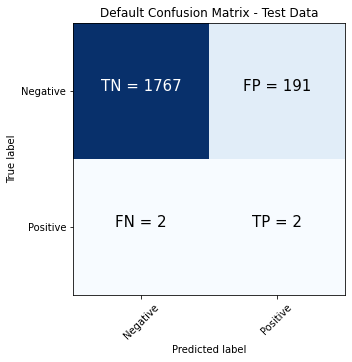

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 5))
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
classNames = ['Negative','Positive']
plt.title('Default Confusion Matrix - Test Data')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
thresh = cm.max() / 2.
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]), fontsize = 15,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
plt.show()

**ROC curve**

In [0]:
trainingSummary = lrModel.summary

# Obtain the objective per iteration
# objectiveHistory = trainingSummary.objectiveHistory
# print("objectiveHistory:")
# for objective in objectiveHistory:
#     print(objective)

# Obtain the receiver-operating characteristic as a dataframe and areaUnderROC.
trainingSummary.roc.show(5)
print("areaUnderROC: " + str(trainingSummary.areaUnderROC))

# Set the model threshold to maximize F-Measure
fMeasure = trainingSummary.fMeasureByThreshold
maxFMeasure = fMeasure.groupBy().max('F-Measure').select('max(F-Measure)').head(5)
# bestThreshold = fMeasure.where(fMeasure['F-Measure'] == maxFMeasure['max(F-Measure)']) \
#     .select('threshold').head()['threshold']
# lr.setThreshold(bestThreshold)

+--------------------+--------------------+
|                 FPR|                 TPR|
+--------------------+--------------------+
|                 0.0|                 0.0|
|6.714413607878246E-4|0.002202643171806...|
|0.001566696508504924|0.002202643171806...|
|0.002238137869292...|0.004405286343612335|
|0.002909579230080573|0.006607929515418502|
+--------------------+--------------------+
only showing top 5 rows

areaUnderROC: 0.7704883281603122


In [0]:
trainingSummary.roc.display()

FPR,TPR
0.0,0.0
6.714413607878246E-4,0.0022026431718061676
0.001566696508504924,0.0022026431718061676
0.0022381378692927483,0.004405286343612335
0.002909579230080573,0.006607929515418502
0.0035810205908683975,0.00881057268722467
0.004252461951656222,0.011013215859030838
0.004476275738585497,0.01762114537444934
0.004700089525514772,0.024229074889867842
0.005147717099373322,0.028634361233480177


In [0]:
m = lrModel.coefficients
m = m.toArray()
X = input_DF.toPandas()

**Coefficient values/Feature importance**

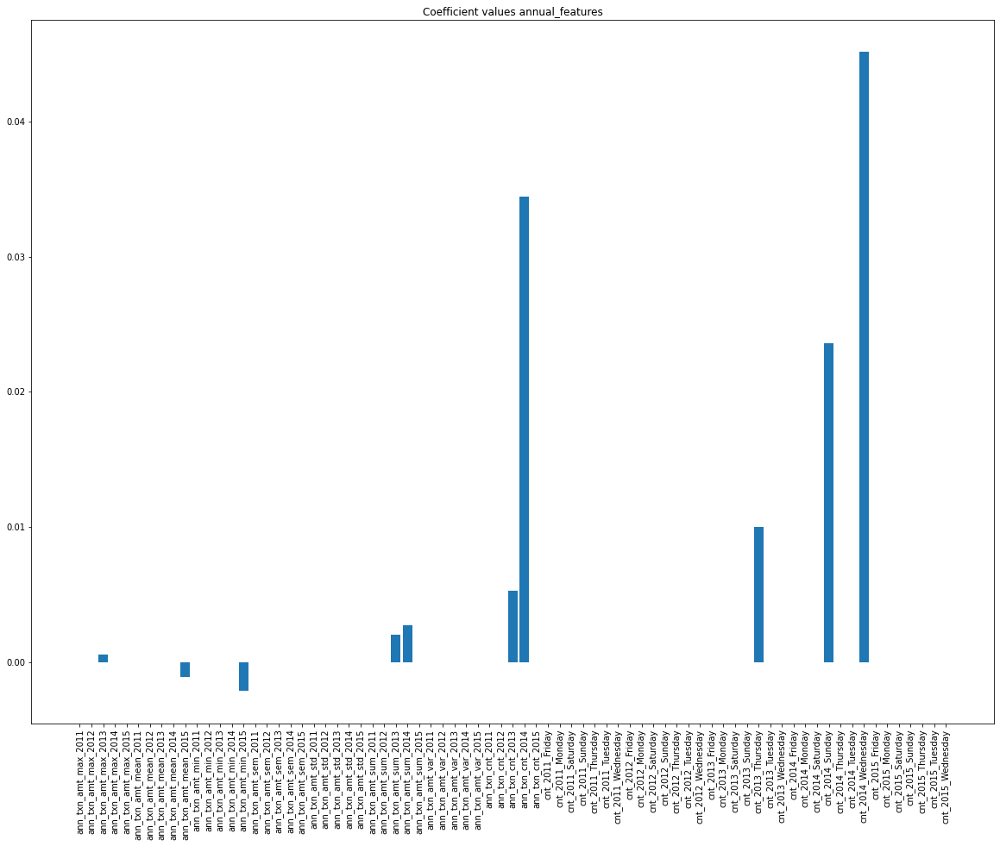

In [0]:
plt.rcParams['figure.figsize'] = (20,15)
# Create plot
plt.figure()
# Create plot title
plt.title("Coefficient values annual_features")
# Add bars
plt.bar(range(X.shape[1]), m)
# Add feature names as x-axis labels
plt.xticks(range(X.shape[1]), X.columns, rotation=90)
# Show plot
plt.show()

In [0]:
from pyspark.ml.functions import vector_to_array
predDF = predDF.withColumn("xs", vector_to_array("probability"))

In [0]:
array_xs = np.array(predDF.select('xs').collect())
import pandas as pd
g = pd.DataFrame(array_xs[::,0])
h = g.to_numpy()

**Probability distribution curve.**

Out[48]: Text(3.674999999999997, 0.5, 'Counts of clients')<Figure size 360x360 with 0 Axes>

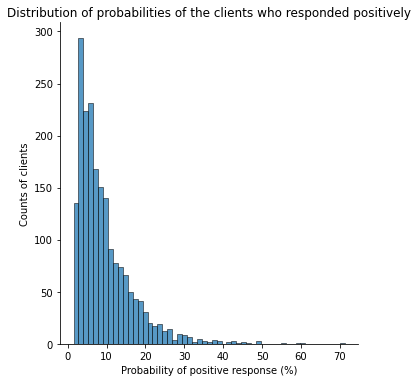

In [0]:
import seaborn as sns
plt.figure(figsize=(5,5))
sns.displot(data = h[:,1], x = 100*h[:,1])
plt.title('Distribution of probabilities of the clients who responded positively')
plt.xlabel('Probability of positive response (%)')
plt.ylabel('Counts of clients')

### Annual features: Decision tree

**Hyperparameter tuning**

In [0]:
from pyspark.ml.classification import DecisionTreeClassifier

In [0]:
dt = DecisionTreeClassifier(featuresCol="features", labelCol="response")
pipeline_dt = Pipeline(stages = [vecAssembler, dt])

In [0]:
dtparamGrid = (ParamGridBuilder()
             .addGrid(dt.maxDepth, [2, 5, 10, 12])
             .addGrid(dt.maxBins, [10, 20, 40, 60])
             .build())

dtevaluator = BinaryClassificationEvaluator().setLabelCol("response")

# Create 5-fold CrossValidator
dtcv = CrossValidator(estimator = pipeline_dt,
                      estimatorParamMaps = dtparamGrid,
                      evaluator = dtevaluator,
                      numFolds = 5)

dtcvModel = dtcv.fit(trainDF)

/databricks/spark/python/pyspark/ml/util.py:886: UserWarning: Cannot find mlflow module. To enable MLflow logging, install mlflow from PyPI.
  warnings.warn(_MLflowInstrumentation._NO_MLFLOW_WARNING)


In [0]:
prediction_dt = dtcvModel.transform(testDF)
#prediction_dt.display()

In [0]:
evaluator_dt = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc_dt = evaluator_dt.evaluate(prediction_dt, {evaluator_dt.metricName: "accuracy"})
acc_dt

Out[53]: 0.8995922528032619

In [0]:
f1 = evaluator_dt.evaluate(prediction_dt, {evaluator_dt.metricName: "f1"})
weightedPrecision = evaluator_dt.evaluate(prediction_dt, {evaluator_dt.metricName: "weightedPrecision"})
weightedRecall = evaluator_dt.evaluate(prediction_dt, {evaluator_dt.metricName: "weightedRecall"})
auc = evaluator_dt.evaluate(prediction_dt)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8611567490116573
Precision value is 0.8550868667399435
Recall value is 0.8995922528032619


In [0]:
print(dtcvModel.getEstimatorParamMaps()[np.argmax(dtcvModel.avgMetrics)])

{Param(parent='DecisionTreeClassifier_109c5926dc3d', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes.'): 5, Param(parent='DecisionTreeClassifier_109c5926dc3d', name='maxBins', doc='Max number of bins for discretizing continuous features.  Must be >=2 and >= number of categories for any categorical feature.'): 20}


The best parameters after tuning are:
maxDepth = 5
maxBins = 20

In [0]:
dt = DecisionTreeClassifier(featuresCol="features", labelCol="response", maxDepth=5, maxBins=20)
dtModel = dt.fit(vecTrainDF)

In [0]:
pipeline_dt = Pipeline(stages = [vecAssembler, dt])
pipelineModel_dt = pipeline_dt.fit(trainDF)
predDF_dt = pipelineModel_dt.transform(testDF)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator_dt = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "accuracy"})
acc

Out[58]: 0.8995922528032619

In [0]:
f1 = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "f1"})
weightedPrecision = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "weightedPrecision"})
weightedRecall = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "weightedRecall"})
auc = evaluator_dt.evaluate(predDF_dt)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8611567490116573
Precision value is 0.8550868667399435
Recall value is 0.8995922528032619


**ROC curve**

In [0]:
from sklearn.metrics import roc_curve, auc

Decision Tree Area Under ROC
Area under ROC = 0.78


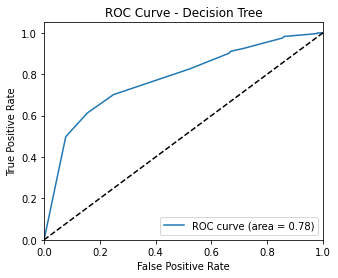

In [0]:
from pyspark import SparkContext
sc = SparkContext.getOrCreate()
from pyspark.mllib.evaluation import BinaryClassificationMetrics
#ROC Grafik
PredAndLabels           = predDF_dt.select("probability", "response")
PredAndLabels_collect   = PredAndLabels.collect()
PredAndLabels_list      = [(float(i[0][0]), 1.0-float(i[1])) for i in PredAndLabels_collect]
PredAndLabels           = sc.parallelize(PredAndLabels_list)

metrics = BinaryClassificationMetrics(PredAndLabels)

# Area under ROC
print("Decision Tree Area Under ROC")
print("Area under ROC = %.2f" % metrics.areaUnderROC)

# Visualization
FPR = dict()                                                        # FPR: False Positive Rate
tpr = dict()                                                        # TPR: True Positive Rate
roc_auc = dict()
 
y_test = [i[1] for i in PredAndLabels_list]
y_score = [i[0] for i in PredAndLabels_list]
 
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree')
plt.legend(loc="lower right")
plt.show()

**Confusion Matrix**

In [0]:
from sklearn.metrics import classification_report, confusion_matrix
y_true = predDF_dt.select(['response']).collect()
y_pred = predDF_dt.select(['prediction']).collect()
cm = confusion_matrix(y_pred,y_true)
cm

Out[62]: array([[1757,  185],
       [  12,    8]])

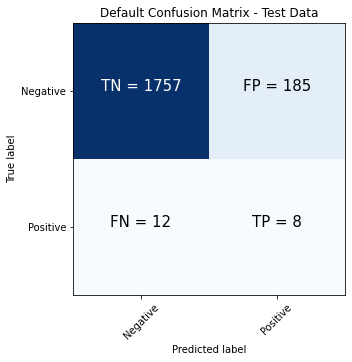

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 5))
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
classNames = ['Negative','Positive']
plt.title('Default Confusion Matrix - Test Data')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
thresh = cm.max() / 2.
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]), fontsize = 15,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
plt.show()

In [0]:
dt_try = pipelineModel_dt.stages[-1]
m_dt = dt_try.featureImportances
m_dt = m_dt.toArray()
X_dt = input_DF.toPandas()

**Coefficient values**

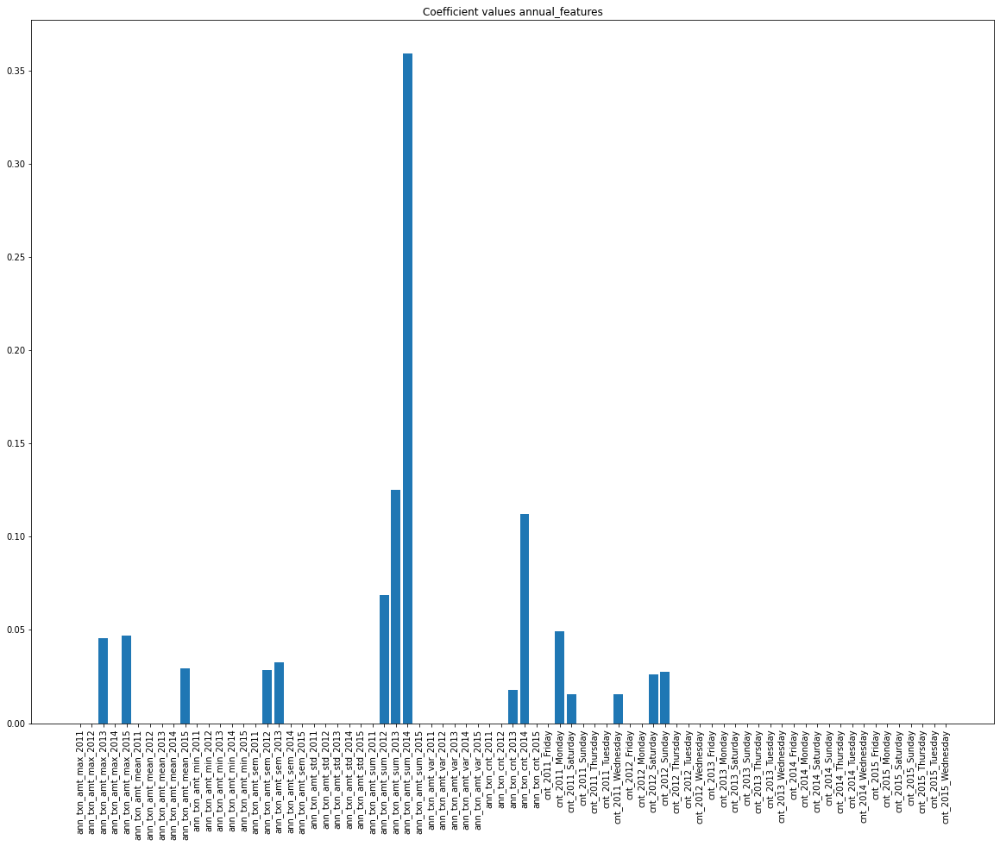

In [0]:
plt.rcParams['figure.figsize'] = (20,15)
# Create plot
plt.figure()
# Create plot title
plt.title("Coefficient values annual_features")
# Add bars
plt.bar(range(X_dt.shape[1]), m_dt)
# Add feature names as x-axis labels
plt.xticks(range(X_dt.shape[1]), X_dt.columns, rotation=90)
# Show plot
plt.show()

In [0]:
from pyspark.ml.functions import vector_to_array
predDF_dt = predDF_dt.withColumn("xs", vector_to_array("probability"))
array_xs_dt = np.array(predDF_dt.select('xs').collect())
import pandas as pd
g_dt = pd.DataFrame(array_xs_dt[::,0])
h_dt = g_dt.to_numpy()

**Probability distribution**

Out[67]: Text(3.799999999999997, 0.5, 'Counts of clients')<Figure size 360x360 with 0 Axes>

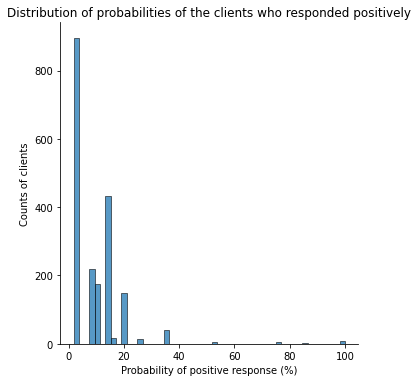

In [0]:
import seaborn as sns
plt.figure(figsize=(5,5))
sns.displot(data = h_dt[:,1], x = 100*h_dt[:,1])
plt.title('Distribution of probabilities of the clients who responded positively')
plt.xlabel('Probability of positive response (%)')
plt.ylabel('Counts of clients')

### Annual features: Random Forest

Sampling the data to obtain more efficieny

In [0]:
from pyspark.sql.functions import col, explode, array, lit
major_df = annual_features_outputs.filter(col("response") == 0)
minor_df = annual_features_outputs.filter(col("response") == 1)
ratio = int(major_df.count()/minor_df.count())
print("ratio: {}".format(ratio))

ratio: 9


In [0]:
a = range(ratio)
# duplicate the minority rows
oversampled_df = minor_df.withColumn("dummy", explode(array([lit(x) for x in a]))).drop('dummy')
# combine both oversampled minority rows and previous majority rows 
combined_df = major_df.unionAll(oversampled_df)
combined_df.display()

ann_txn_amt_max_2011,ann_txn_amt_max_2012,ann_txn_amt_max_2013,ann_txn_amt_max_2014,ann_txn_amt_max_2015,ann_txn_amt_mean_2011,ann_txn_amt_mean_2012,ann_txn_amt_mean_2013,ann_txn_amt_mean_2014,ann_txn_amt_mean_2015,ann_txn_amt_min_2011,ann_txn_amt_min_2012,ann_txn_amt_min_2013,ann_txn_amt_min_2014,ann_txn_amt_min_2015,ann_txn_amt_sem_2011,ann_txn_amt_sem_2012,ann_txn_amt_sem_2013,ann_txn_amt_sem_2014,ann_txn_amt_sem_2015,ann_txn_amt_std_2011,ann_txn_amt_std_2012,ann_txn_amt_std_2013,ann_txn_amt_std_2014,ann_txn_amt_std_2015,ann_txn_amt_sum_2011,ann_txn_amt_sum_2012,ann_txn_amt_sum_2013,ann_txn_amt_sum_2014,ann_txn_amt_sum_2015,ann_txn_amt_var_2011,ann_txn_amt_var_2012,ann_txn_amt_var_2013,ann_txn_amt_var_2014,ann_txn_amt_var_2015,ann_txn_cnt_2011,ann_txn_cnt_2012,ann_txn_cnt_2013,ann_txn_cnt_2014,ann_txn_cnt_2015,cnt_2011_Friday,cnt_2011_Monday,cnt_2011_Saturday,cnt_2011_Sunday,cnt_2011_Thursday,cnt_2011_Tuesday,cnt_2011_Wednesday,cnt_2012_Friday,cnt_2012_Monday,cnt_2012_Saturday,cnt_2012_Sunday,cnt_2012_Thursday,cnt_2012_Tuesday,cnt_2012_Wednesday,cnt_2013_Friday,cnt_2013_Monday,cnt_2013_Saturday,cnt_2013_Sunday,cnt_2013_Thursday,cnt_2013_Tuesday,cnt_2013_Wednesday,cnt_2014_Friday,cnt_2014_Monday,cnt_2014_Saturday,cnt_2014_Sunday,cnt_2014_Thursday,cnt_2014_Tuesday,cnt_2014_Wednesday,cnt_2015_Friday,cnt_2015_Monday,cnt_2015_Saturday,cnt_2015_Sunday,cnt_2015_Thursday,cnt_2015_Tuesday,cnt_2015_Wednesday,response
96,81,105,90,39,70.66666667,67.4,70.66666667,70.66666667,39.0,56,52,36,59,39,12.71918935,5.688585061,19.91928156,9.735387911,0.0,22.03028219,12.72006289,34.50120771,16.86218649,0.0,212,337,212,212,39,485.3333333,161.8,1190.333333,284.3333333,0.0,3,5,3,3,1,1,0,0,1,0,0,1,0,0,1,3,0,1,0,1,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0
94,95,97,97,98,81.33333333,74.8,85.2,56.5,73.33333333,57,51,65,36,44,12.17009084,7.618398782,5.851495535,13.97915114,15.76212056,21.07921567,17.03525756,13.08434179,27.95830229,27.30079364,244,374,426,226,220,444.3333333,290.2,171.2,781.6666667,745.3333333,3,5,5,4,3,1,1,0,1,0,0,0,2,1,0,0,0,1,1,0,1,1,0,0,2,1,0,0,1,0,0,3,0,0,2,0,0,0,0,1,0
98,100,94,94,0,71.0,65.33333333,69.4,71.5,0.0,46,35,49,56,0,15.0443788,18.88856209,7.775602871,6.47945471,0.0,26.05762844,32.71594922,17.38677658,15.87135785,0.0,213,196,347,429,0,679.0,1070.333333,302.3,251.9,0.0,3,3,5,6,0,1,0,0,0,1,0,1,1,1,0,0,0,0,1,0,2,0,3,0,0,0,0,0,1,1,1,2,1,0,0,0,0,0,0,0,0
0,102,99,93,59,0.0,82.2,79.66666667,74.83333333,59.0,0,35,49,36,59,0.0,12.21228889,15.50627113,8.795516535,0.0,0.0,27.30750813,26.85764944,21.54452753,0.0,0,411,239,449,59,0.0,745.7,721.3333333,464.1666667,0.0,0,5,3,6,1,0,0,0,0,0,0,0,0,0,0,1,1,1,2,0,0,0,0,1,1,1,2,1,1,0,0,0,2,0,0,0,0,1,0,0,0
105,96,100,75,84,82.0,70.4,72.57142857,75.0,55.33333333,53,50,45,75,41,10.0895986,8.663717447,8.839460075,0.0,6.458413978,22.56102835,19.37266115,23.38701308,0.0,15.81981879,410,352,508,75,332,509.0,375.3,546.952381,0.0,250.2666667,5,5,7,1,6,1,1,1,0,2,0,0,1,0,0,1,1,1,1,1,1,1,0,1,2,1,0,1,0,0,0,0,0,3,1,2,0,0,0,0,0
102,104,88,73,37,72.0,61.3,56.6,50.5,37.0,40,35,38,38,37,16.01561738,7.163255002,9.37869927,5.296225071,0.0,32.03123476,22.65220127,20.97140911,12.97304899,0.0,288,613,283,303,37,1026.0,513.1222222,439.8,168.3,0.0,4,10,5,6,1,0,1,0,0,2,1,0,1,1,1,4,1,1,1,4,0,0,0,0,1,0,0,1,0,2,2,1,0,0,0,0,0,0,1,0,0
104,87,94,93,81,81.2,56.8,67.33333333,91.5,81.0,53,35,49,90,81,8.481745103,9.425497334,13.64225462,1.5,0.0,18.96575862,21.07605276,23.62907813,2.121320344,0.0,406,284,202,183,81,359.7,444.2,558.3333333,4.5,0.0,5,5,3,2,1,1,0,1,2,0,1,0,1,0,1,1,0,2,0,0,0,2,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0
86,95,103,91,0,64.42857143,75.0,69.0,75.66666667,0.0,44,55,37,61,0,5.259264582,20.0,16.20185175,5.358275013,0.0,13.91470616,28.28427125,32.40370349,13.12503968,0.0,451,150,276,454,0,193.6190476,800.0,1050.0,172.2666667,0.0,7,2,4,6,0,1,3,0,0,2,1,0,0,0,0,1,0,1,0,0,2,0,0,1,0,1,1,1,0,1,1,0,2,0,0,0,0,0,0,0,0
93,92,72,95,49,74.33333333,62.5,56.25,65.0,49.0,64,36,41,35,49,9.351173426,7.764387567,8.806957477,30.0

In [0]:
trainDF_sample, testDF_sample = combined_df.randomSplit([.7, .3], seed=42)

In [0]:
from pyspark.ml.feature import VectorAssembler
vecAssembler = VectorAssembler(inputCols=input_DF.columns, outputCol="features")
vecTrainDF = vecAssembler.transform(trainDF_sample)
#vecTrainDF.display()

In [0]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(featuresCol="features", labelCol="response")
rfModel = rf.fit(vecTrainDF)

**Hyper parameter tuning**

In [0]:
#rf = RandomForestClassifier(featuresCol="features", labelCol="response")
pipeline_rf = Pipeline(stages = [vecAssembler, rf])

In [0]:
rfparamGrid = (ParamGridBuilder()
             .addGrid(rf.numTrees, [10,20,30,40,50])
             .addGrid(rf.maxDepth, [2,5,10])
             .build())

rfevaluator = BinaryClassificationEvaluator().setLabelCol("response")

# Create 3-fold CrossValidator
rfcv = CrossValidator(estimator = pipeline_rf,
                      estimatorParamMaps = rfparamGrid,
                      evaluator = rfevaluator,
                      numFolds = 3)

rfcvModel = rfcv.fit(trainDF_sample)

/databricks/spark/python/pyspark/ml/util.py:886: UserWarning: Cannot find mlflow module. To enable MLflow logging, install mlflow from PyPI.
  warnings.warn(_MLflowInstrumentation._NO_MLFLOW_WARNING)


In [0]:
prediction_rf = rfcvModel.transform(testDF_sample)

In [0]:
evaluator_rf = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc_rf = evaluator_rf.evaluate(prediction_rf, {evaluator_rf.metricName: "accuracy"})
acc_rf

Out[76]: 0.8996006845407872

In [0]:
f1 = evaluator_rf.evaluate(prediction_rf, {evaluator_rf.metricName: "f1"})
weightedPrecision = evaluator_rf.evaluate(prediction_rf, {evaluator_rf.metricName: "weightedPrecision"})
weightedRecall = evaluator_rf.evaluate(prediction_rf, {evaluator_rf.metricName: "weightedRecall"})
auc = evaluator_rf.evaluate(prediction_rf)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8988022148222825
Precision value is 0.9166981973814465
Recall value is 0.8996006845407872


In [0]:
print(rfcvModel.getEstimatorParamMaps()[np.argmax(rfcvModel.avgMetrics)])

{Param(parent='RandomForestClassifier_7fc7168d70cf', name='numTrees', doc='Number of trees to train (>= 1).'): 50, Param(parent='RandomForestClassifier_7fc7168d70cf', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes.'): 10}


The best parameters after tuning are: maxDepth = 10 numTrees = 50

In [0]:
rf = RandomForestClassifier(featuresCol="features", labelCol="response", maxDepth=10, numTrees=50)
rfModel = rf.fit(vecTrainDF)

In [0]:
pipeline_rf = Pipeline(stages = [vecAssembler, rf])
pipelineModel_rf = pipeline_rf.fit(trainDF_sample)
predDF_rf = pipelineModel_rf.transform(testDF_sample)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator_rf = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "accuracy"})
acc

Out[81]: 0.8996006845407872

In [0]:
f1 = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "f1"})
weightedPrecision = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "weightedPrecision"})
weightedRecall = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "weightedRecall"})
auc = evaluator_rf.evaluate(predDF_rf)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8988022148222825
Precision value is 0.9166981973814465
Recall value is 0.8996006845407872


**ROC curve**

Random Forest Area Under ROC
Area under ROC = 0.99


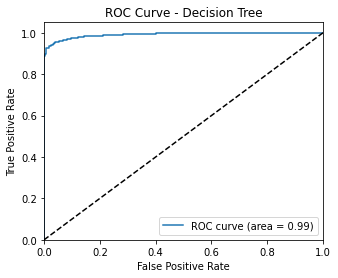

In [0]:
from pyspark import SparkContext
sc = SparkContext.getOrCreate()
from sklearn.metrics import roc_curve, auc
from pyspark.mllib.evaluation import BinaryClassificationMetrics
#ROC Grafik
PredAndLabels           = predDF_rf.select("probability", "response")
PredAndLabels_collect   = PredAndLabels.collect()
PredAndLabels_list      = [(float(i[0][0]), 1.0-float(i[1])) for i in PredAndLabels_collect]
PredAndLabels           = sc.parallelize(PredAndLabels_list)

metrics = BinaryClassificationMetrics(PredAndLabels)

# Area under ROC
print("Random Forest Area Under ROC")
print("Area under ROC = %.2f" % metrics.areaUnderROC)

# Visualization
FPR = dict()                                                        # FPR: False Positive Rate
tpr = dict()                                                        # TPR: True Positive Rate
roc_auc = dict()
 
y_test = [i[1] for i in PredAndLabels_list]
y_score = [i[0] for i in PredAndLabels_list]
 
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree')
plt.legend(loc="lower right")
plt.show()

**Confusion Matrix**

In [0]:
from sklearn.metrics import classification_report, confusion_matrix
y_true = predDF_rf.select(['response']).collect()
y_pred = predDF_rf.select(['prediction']).collect()
cm = confusion_matrix(y_pred,y_true)
cm

Out[84]: array([[1439,    0],
       [ 352, 1715]])

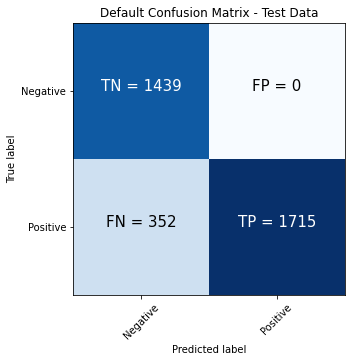

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 5))
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
classNames = ['Negative','Positive']
plt.title('Default Confusion Matrix - Test Data')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
thresh = cm.max() / 2.
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]), fontsize = 15,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
plt.show()

In [0]:
rf_try = pipelineModel_rf.stages[-1]
m_rf = rf_try.featureImportances
m_rf = m_rf.toArray()
X_rf = input_DF.toPandas()

**Coefficient values**

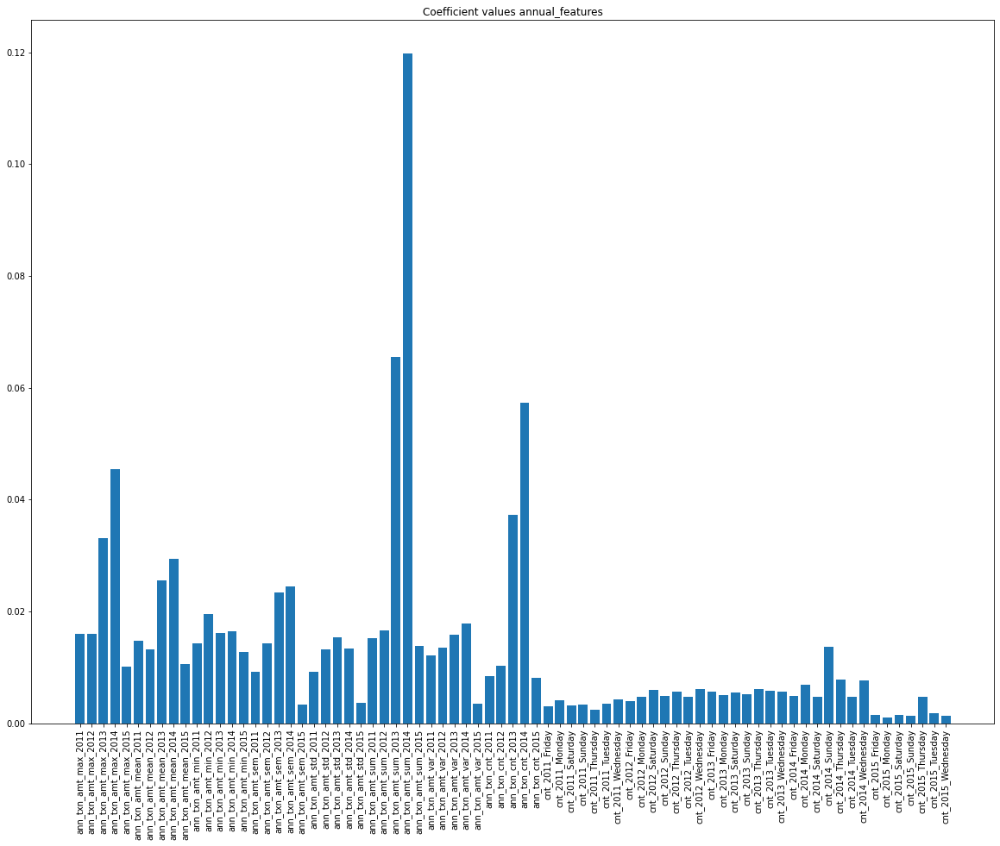

In [0]:
plt.rcParams['figure.figsize'] = (20,15)
# Create plot
plt.figure()
# Create plot title
plt.title("Coefficient values annual_features")
# Add bars
plt.bar(range(X_rf.shape[1]), m_rf)
# Add feature names as x-axis labels
plt.xticks(range(X_rf.shape[1]), X_rf.columns, rotation=90)
# Show plot
plt.show()

In [0]:
from pyspark.ml.functions import vector_to_array
predDF_rf = predDF_rf.withColumn("xs", vector_to_array("probability"))
array_xs_rf = np.array(predDF_rf.select('xs').collect())
import pandas as pd
g_rf = pd.DataFrame(array_xs_rf[::,0])
h_rf = g_rf.to_numpy()

**Probability distribution**

Out[89]: Text(3.799999999999997, 0.5, 'Counts of clients')<Figure size 360x360 with 0 Axes>

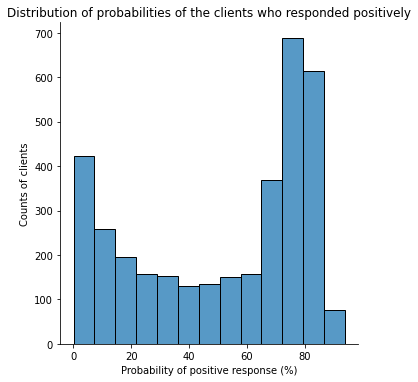

In [0]:
import seaborn as sns
plt.figure(figsize=(5,5))
sns.displot(data = h_rf[:,1], x = 100*h_rf[:,1])
plt.title('Distribution of probabilities of the clients who responded positively')
plt.xlabel('Probability of positive response (%)')
plt.ylabel('Counts of clients')

### Monthly features: Logistic regression

In [0]:
monthly_features_outputs = monthly_features_outputs.drop("CLNT_NO", "ME_DT")

In [0]:
trainDF_mon, testDF_mon = monthly_features_outputs.randomSplit([.7, .3], seed=1148)
#print(f"There are {trainDF.cache().count()} rows in the training set, and {testDF.cache().count()} in the test set")

In [0]:
input_DF = monthly_features_outputs.drop("response")

In [0]:
from pyspark.ml.feature import VectorAssembler
vecAssembler = VectorAssembler(inputCols=input_DF.columns, outputCol="features")
vecTrainDF = vecAssembler.transform(trainDF_mon)

In [0]:
from pyspark.ml.classification import LogisticRegression

In [0]:
from pyspark.ml.tuning import TrainValidationSplit, ParamGridBuilder, CrossValidator
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator

In [0]:
lr = LogisticRegression(featuresCol="features", labelCol="response")
lrModel = lr.fit(vecTrainDF)

In [0]:
pipeline = Pipeline(stages = [vecAssembler, lr])
pipelineModel = pipeline.fit(trainDF_mon)
predDF = pipelineModel.transform(testDF_mon)
#predDF.display()

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator_lr = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc = evaluator_lr.evaluate(predDF, {evaluator_lr.metricName: "accuracy"})
acc

Out[100]: 0.9071846737933802

In [0]:
f1 = evaluator_lr.evaluate(predDF, {evaluator_lr.metricName: "f1"})
weightedPrecision = evaluator_lr.evaluate(predDF, {evaluator_lr.metricName: "weightedPrecision"})
weightedRecall = evaluator_lr.evaluate(predDF, {evaluator_lr.metricName: "weightedRecall"})
auc = evaluator_lr.evaluate(predDF)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8630354927597974
Precision value is 0.8229840323656017
Recall value is 0.9071846737933802


**Confusion Matrix**

In [0]:
trainingSummary = lrModel.summary

# for multiclass, we can inspect metrics on a per-label basis
print("False positive rate by label:")
for i, rate in enumerate(trainingSummary.falsePositiveRateByLabel):
    print("label %d: %s" % (i, rate))

print("True positive rate by label:")
for i, rate in enumerate(trainingSummary.truePositiveRateByLabel):
    print("label %d: %s" % (i, rate))

print("Precision by label:")
for i, prec in enumerate(trainingSummary.precisionByLabel):
    print("label %d: %s" % (i, prec))

print("Recall by label:")
for i, rec in enumerate(trainingSummary.recallByLabel):
    print("label %d: %s" % (i, rec))

print("F-measure by label:")
for i, f in enumerate(trainingSummary.fMeasureByLabel()):
    print("label %d: %s" % (i, f))

accuracy = trainingSummary.accuracy
falsePositiveRate = trainingSummary.weightedFalsePositiveRate
truePositiveRate = trainingSummary.weightedTruePositiveRate
fMeasure = trainingSummary.weightedFMeasure()
precision = trainingSummary.weightedPrecision
recall = trainingSummary.weightedRecall
print("Accuracy: %s\nFPR: %s\nTPR: %s\nF-measure: %s\nPrecision: %s\nRecall: %s"
      % (accuracy, falsePositiveRate, truePositiveRate, fMeasure, precision, recall))

False positive rate by label:
label 0: 1.0
label 1: 0.0
True positive rate by label:
label 0: 1.0
label 1: 0.0
Precision by label:
label 0: 0.9055112544454508
label 1: 0.0
Recall by label:
label 0: 1.0
label 1: 0.0
F-measure by label:
label 0: 0.9504129165681324
label 1: 0.0
Accuracy: 0.9055112544454508
FPR: 0.9055112544454508
TPR: 0.9055112544454508
F-measure: 0.8606095923227691
Precision: 0.8199506319273738
Recall: 0.9055112544454508


In [0]:
from sklearn.metrics import classification_report, confusion_matrix
y_true = predDF.select(['response']).collect()
y_pred = predDF.select(['prediction']).collect()
cm = confusion_matrix(y_pred,y_true)
cm

Out[103]: array([[88172,  9021],
       [    0,     0]])

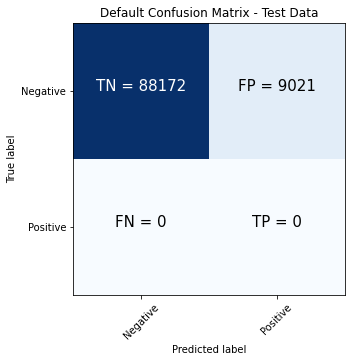

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 5))
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
classNames = ['Negative','Positive']
plt.title('Default Confusion Matrix - Test Data')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
thresh = cm.max() / 2.
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]), fontsize = 15,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
plt.show()

In [0]:
trainingSummary = lrModel.summary

# Obtain the objective per iteration
# objectiveHistory = trainingSummary.objectiveHistory
# print("objectiveHistory:")
# for objective in objectiveHistory:
#     print(objective)

# Obtain the receiver-operating characteristic as a dataframe and areaUnderROC.
trainingSummary.roc.show(5)
print("areaUnderROC: " + str(trainingSummary.areaUnderROC))

# Set the model threshold to maximize F-Measure
fMeasure = trainingSummary.fMeasureByThreshold
maxFMeasure = fMeasure.groupBy().max('F-Measure').select('max(F-Measure)').head(5)
# bestThreshold = fMeasure.where(fMeasure['F-Measure'] == maxFMeasure['max(F-Measure)']) \
#     .select('threshold').head()['threshold']
# lr.setThreshold(bestThreshold)

+--------------------+--------------------+
|                 FPR|                 TPR|
+--------------------+--------------------+
|                 0.0|                 0.0|
| 7.75734630452707E-4|0.002150738731999...|
|0.001556348095059...|0.004254722274172433|
|0.002317446223050...|0.006545726575649...|
|0.003117575024272...|0.008462689358518795|
+--------------------+--------------------+
only showing top 5 rows

areaUnderROC: 0.6282392413501762


In [0]:
trainingSummary.roc.display()

FPR,TPR
0.0,0.0
7.75734630452707E-4,0.0021507387319992517
0.0015563480950592046,0.004254722274172433
0.0023174462230505398,0.0065457265756498975
0.0031175750242721997,0.008462689358518795
0.003966492167031766,0.009912100243126987
0.004786136304868589,0.011642042266691603
0.005576507437782667,0.013652515429212643
0.0063863939073119085,0.0154759678324294
0.00719628037684115,0.017299420235646158


In [0]:
m = lrModel.coefficients
m = m.toArray()
X = input_DF.toPandas()

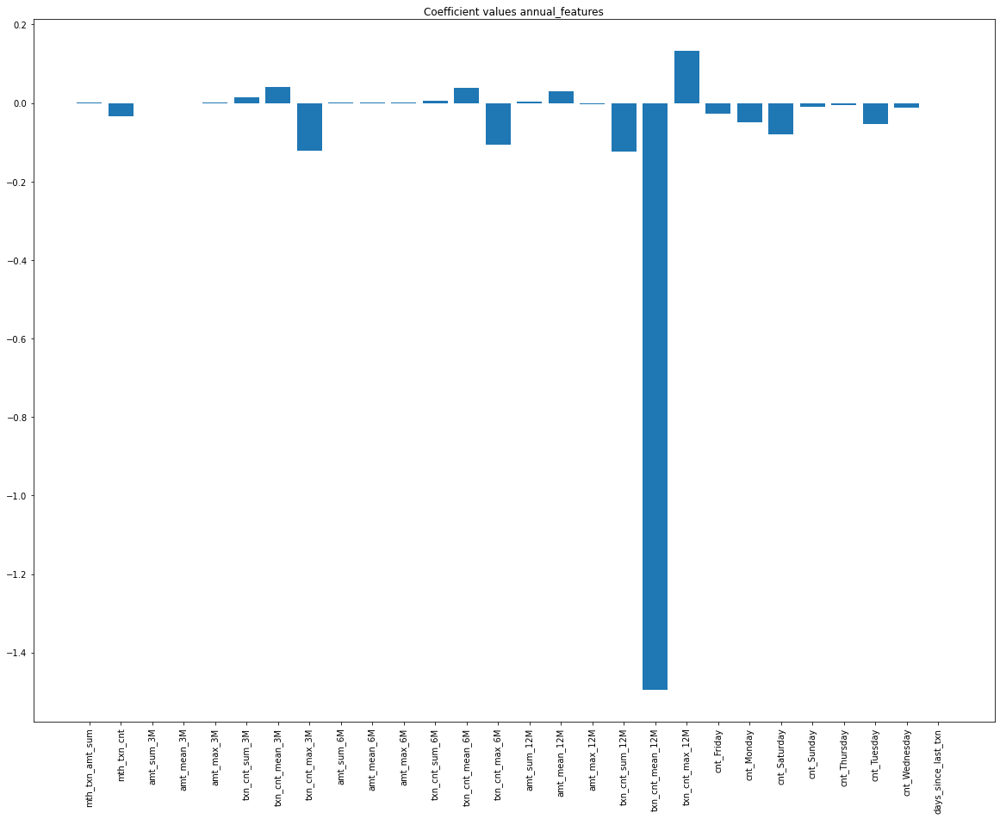

In [0]:
plt.rcParams['figure.figsize'] = (20,15)
# Create plot
plt.figure()
# Create plot title
plt.title("Coefficient values annual_features")
# Add bars
plt.bar(range(X.shape[1]), m)
# Add feature names as x-axis labels
plt.xticks(range(X.shape[1]), X.columns, rotation=90)
# Show plot
plt.show()

In [0]:
from pyspark.ml.functions import vector_to_array
predDF = predDF.withColumn("xs", vector_to_array("probability"))

In [0]:
array_xs = np.array(predDF.select('xs').collect())
import pandas as pd
g = pd.DataFrame(array_xs[::,0])
h = g.to_numpy()

Out[111]: Text(-2.450000000000003, 0.5, 'Counts of clients')<Figure size 360x360 with 0 Axes>

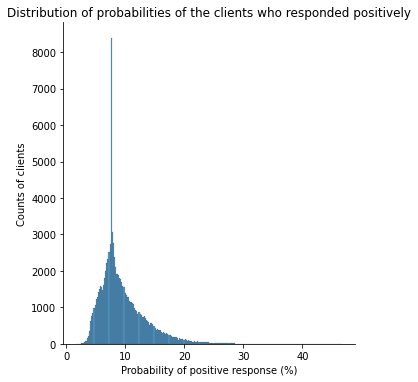

In [0]:
import seaborn as sns
plt.figure(figsize=(5,5))
sns.displot(data = h[:,1], x = 100*h[:,1])
plt.title('Distribution of probabilities of the clients who responded positively')
plt.xlabel('Probability of positive response (%)')
plt.ylabel('Counts of clients')

### Monthly features: Decision tree

In [0]:
dt = DecisionTreeClassifier(featuresCol="features", labelCol="response")
dtModel = dt.fit(vecTrainDF)

In [0]:
pipeline_dt = Pipeline(stages = [vecAssembler, dt])
pipelineModel_dt = pipeline_dt.fit(trainDF_mon)
predDF_dt = pipelineModel_dt.transform(testDF_mon)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator_dt = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "accuracy"})
acc

Out[114]: 0.9071949626001873

In [0]:
f1 = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "f1"})
weightedPrecision = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "weightedPrecision"})
weightedRecall = evaluator_dt.evaluate(predDF_dt, {evaluator_dt.metricName: "weightedRecall"})
auc = evaluator_dt.evaluate(predDF_dt)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8630607239885131
Precision value is 0.9158078261830574
Recall value is 0.9071949626001873


In [0]:
from sklearn.metrics import roc_curve, auc

Decision Tree Area Under ROC
Area under ROC = 0.59


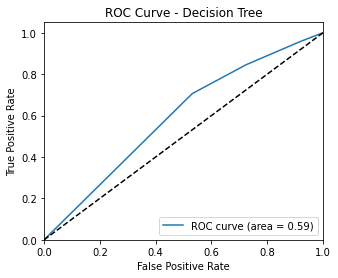

In [0]:
from pyspark import SparkContext
sc = SparkContext.getOrCreate()
from pyspark.mllib.evaluation import BinaryClassificationMetrics
#ROC Grafik
PredAndLabels           = predDF_dt.select("probability", "response")
PredAndLabels_collect   = PredAndLabels.collect()
PredAndLabels_list      = [(float(i[0][0]), 1.0-float(i[1])) for i in PredAndLabels_collect]
PredAndLabels           = sc.parallelize(PredAndLabels_list)

metrics = BinaryClassificationMetrics(PredAndLabels)

# Area under ROC
print("Decision Tree Area Under ROC")
print("Area under ROC = %.2f" % metrics.areaUnderROC)

# Visualization
FPR = dict()                                                        # FPR: False Positive Rate
tpr = dict()                                                        # TPR: True Positive Rate
roc_auc = dict()
 
y_test = [i[1] for i in PredAndLabels_list]
y_score = [i[0] for i in PredAndLabels_list]
 
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree')
plt.legend(loc="lower right")
plt.show()

In [0]:
from sklearn.metrics import classification_report, confusion_matrix
y_true = predDF_dt.select(['response']).collect()
y_pred = predDF_dt.select(['prediction']).collect()
cm = confusion_matrix(y_pred,y_true)
cm

Out[118]: array([[88172,  9020],
       [    0,     1]])

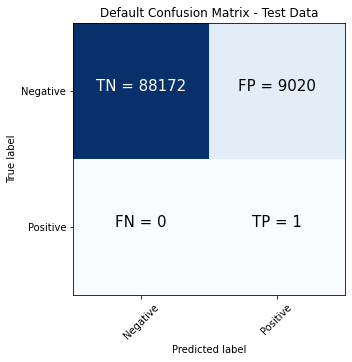

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 5))
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
classNames = ['Negative','Positive']
plt.title('Default Confusion Matrix - Test Data')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
thresh = cm.max() / 2.
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]), fontsize = 15,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
plt.show()

In [0]:
dt_try = pipelineModel_dt.stages[-1]
m_dt = dt_try.featureImportances
m_dt = m_dt.toArray()
X_dt = input_DF.toPandas()

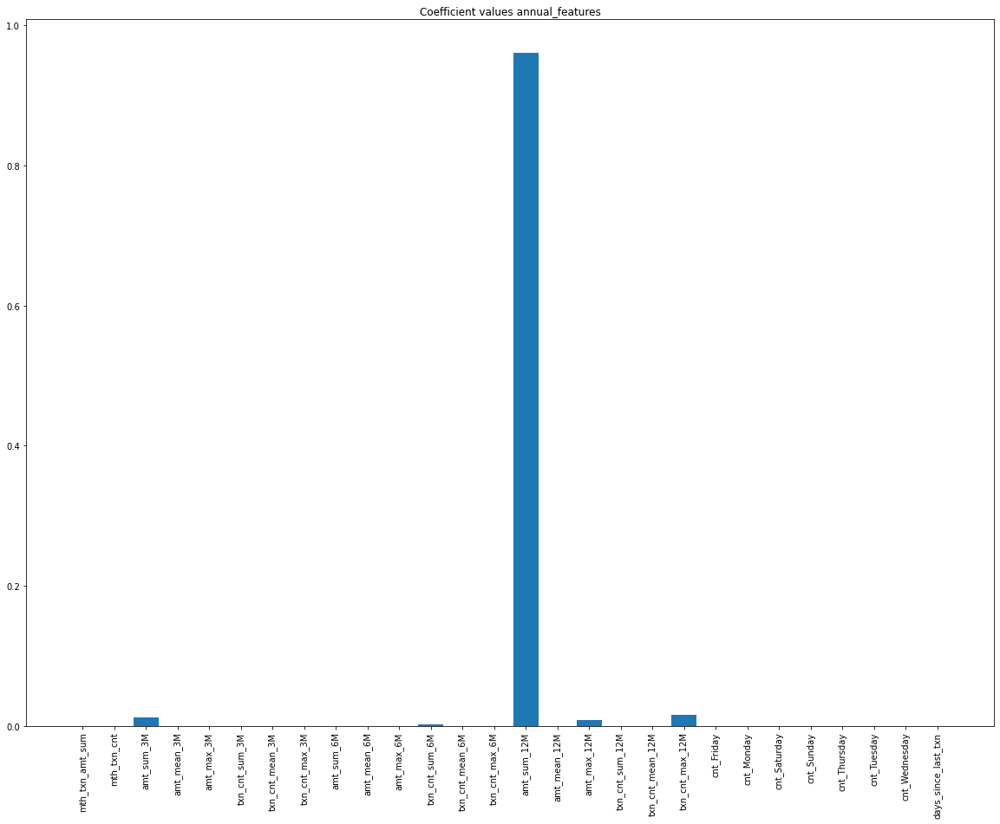

In [0]:
plt.rcParams['figure.figsize'] = (20,15)
# Create plot
plt.figure()
# Create plot title
plt.title("Coefficient values annual_features")
# Add bars
plt.bar(range(X_dt.shape[1]), m_dt)
# Add feature names as x-axis labels
plt.xticks(range(X_dt.shape[1]), X_dt.columns, rotation=90)
# Show plot
plt.show()

In [0]:
from pyspark.ml.functions import vector_to_array
predDF_dt = predDF_dt.withColumn("xs", vector_to_array("probability"))
array_xs_dt = np.array(predDF_dt.select('xs').collect())
import pandas as pd
g_dt = pd.DataFrame(array_xs_dt[::,0])
h_dt = g_dt.to_numpy()

Out[123]: Text(-8.700000000000003, 0.5, 'Counts of clients')<Figure size 360x360 with 0 Axes>

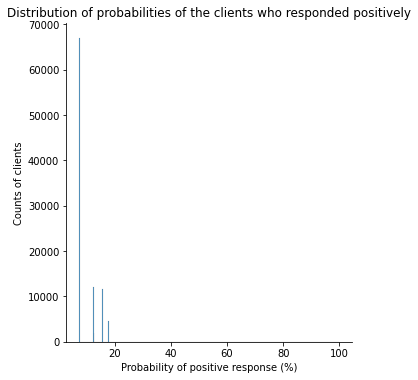

In [0]:
import seaborn as sns
plt.figure(figsize=(5,5))
sns.displot(data = h_dt[:,1], x = 100*h_dt[:,1])
plt.title('Distribution of probabilities of the clients who responded positively')
plt.xlabel('Probability of positive response (%)')
plt.ylabel('Counts of clients')

### Monthly features: Random forest

In [0]:
rf = RandomForestClassifier(featuresCol="features", labelCol="response")
rfModel = rf.fit(vecTrainDF)

In [0]:
pipeline_rf = Pipeline(stages = [vecAssembler, rf])
pipelineModel_rf = pipeline_rf.fit(trainDF_mon)
predDF_rf = pipelineModel_rf.transform(testDF_mon)

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator_rf = MulticlassClassificationEvaluator(labelCol='response', metricName='accuracy')
acc = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "accuracy"})
acc

Out[126]: 0.9071846737933802

In [0]:
f1 = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "f1"})
weightedPrecision = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "weightedPrecision"})
weightedRecall = evaluator_rf.evaluate(predDF_rf, {evaluator_rf.metricName: "weightedRecall"})
auc = evaluator_rf.evaluate(predDF_rf)

print("F1 value is",f1)
print("Precision value is",weightedPrecision)
print("Recall value is",weightedRecall)

F1 value is 0.8630354927597974
Precision value is 0.8229840323656017
Recall value is 0.9071846737933802


Random Forest Area Under ROC
Area under ROC = 0.63


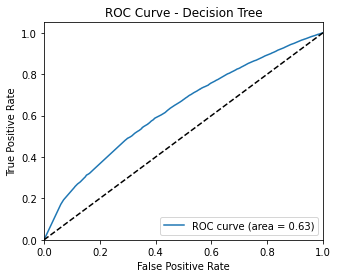

In [0]:
from pyspark import SparkContext
sc = SparkContext.getOrCreate()
from sklearn.metrics import roc_curve, auc
from pyspark.mllib.evaluation import BinaryClassificationMetrics
#ROC Grafik
PredAndLabels           = predDF_rf.select("probability", "response")
PredAndLabels_collect   = PredAndLabels.collect()
PredAndLabels_list      = [(float(i[0][0]), 1.0-float(i[1])) for i in PredAndLabels_collect]
PredAndLabels           = sc.parallelize(PredAndLabels_list)

metrics = BinaryClassificationMetrics(PredAndLabels)

# Area under ROC
print("Random Forest Area Under ROC")
print("Area under ROC = %.2f" % metrics.areaUnderROC)

# Visualization
FPR = dict()                                                        # FPR: False Positive Rate
tpr = dict()                                                        # TPR: True Positive Rate
roc_auc = dict()
 
y_test = [i[1] for i in PredAndLabels_list]
y_score = [i[0] for i in PredAndLabels_list]
 
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,4))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree')
plt.legend(loc="lower right")
plt.show()

In [0]:
from sklearn.metrics import classification_report, confusion_matrix
y_true = predDF_rf.select(['response']).collect()
y_pred = predDF_rf.select(['prediction']).collect()
cm = confusion_matrix(y_pred,y_true)
cm

Out[129]: array([[88172,  9021],
       [    0,     0]])

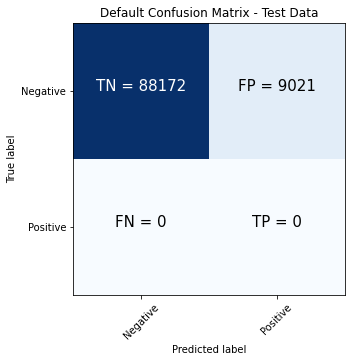

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 5))
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
classNames = ['Negative','Positive']
plt.title('Default Confusion Matrix - Test Data')
plt.ylabel('True label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
thresh = cm.max() / 2.
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]), fontsize = 15,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
plt.show()

In [0]:
rf_try = pipelineModel_rf.stages[-1]
m_rf = rf_try.featureImportances
m_rf = m_rf.toArray()
X_rf = input_DF.toPandas()

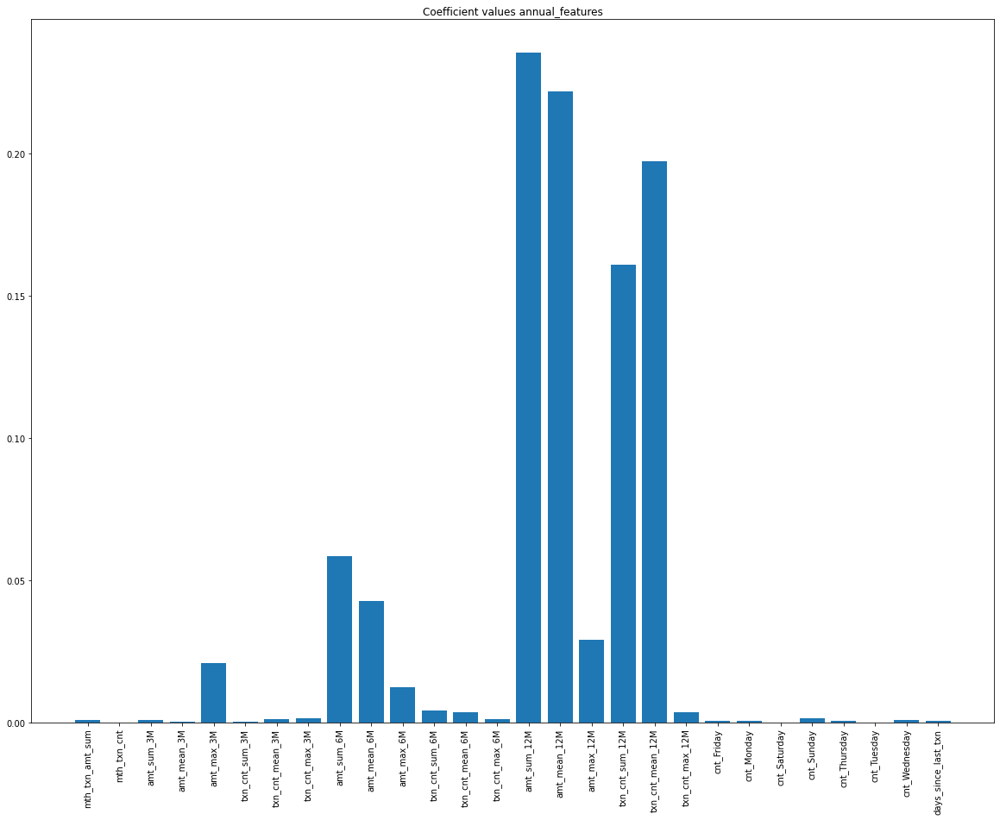

In [0]:
plt.rcParams['figure.figsize'] = (20,15)
# Create plot
plt.figure()
# Create plot title
plt.title("Coefficient values annual_features")
# Add bars
plt.bar(range(X_rf.shape[1]), m_rf)
# Add feature names as x-axis labels
plt.xticks(range(X_rf.shape[1]), X_rf.columns, rotation=90)
# Show plot
plt.show()

In [0]:
from pyspark.ml.functions import vector_to_array
predDF_rf = predDF_rf.withColumn("xs", vector_to_array("probability"))
array_xs_rf = np.array(predDF_rf.select('xs').collect())
import pandas as pd
g_rf = pd.DataFrame(array_xs_rf[::,0])
h_rf = g_rf.to_numpy()

Out[134]: Text(-8.825000000000003, 0.5, 'Counts of clients')<Figure size 360x360 with 0 Axes>

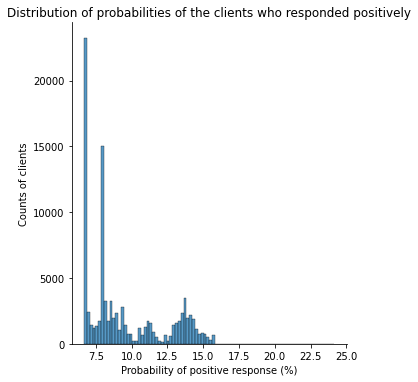

In [0]:
import seaborn as sns
plt.figure(figsize=(5,5))
sns.displot(data = h_rf[:,1], x = 100*h_rf[:,1])
plt.title('Distribution of probabilities of the clients who responded positively')
plt.xlabel('Probability of positive response (%)')
plt.ylabel('Counts of clients')

# 1.3 Comparison of methods

### Logistic Regression results

| Step NO. | Topic | **annual_features_outputs**  | **monthly_features_outputs** |
| ------------- | ------------- | ----- | -----|
| 5 | Coefficient values or feature of importance  |**Parameters:** regParam=0.01, elasticNetParam=1<br>**The top 2 features are:** cnt_2014_wednesday, ann_txn_cnt_2014  |**Parameters:** regParam=0.01, elasticNetParam=1 <br> **The top 2 features are:** txn_cnt_max_12M, txn_cnt_mean_12M |
| 6 | probability distribution for test set  | Frequency of unique values: 0: 1769, 1: 193 <br>From the plot we can infer that majority of the clients gave a negative response to the campaign.<br> Only 40 clients gave 100 percent positive response. |  Frequency of unique values: 0: 88172, 1: 9021<br>From the plot we can infer that majority of the clients gave a negative response to the campaign.<br> |
| 7  | confusion matrix, ROC curves of train/test,<br> precision/recall   | **Confuion matrix:**<br> TN: 1767 TP: 2 FN: 2 FP: 191 <br> In this model, 191 clients were predicted to have given a positive response but they were actually negative.<br>2 clients were predicted to have given a negative response but they actually turned out to be positve.<br> These clients if not predicted correclty could damage the reputation of the campaign since they gave a positive response.<br> **Precision:**<br> 0.8628 <br> **Recall**<br>0.9016<br>**ROC curves for train/test set:**<br> Area under the curve: 0.7704 <br> **Accuracy**<br> 0.9016 <br> **F1 value**<br> 0.8569 | **Confuion matrix:**<br> TN: 88172 TP: 0 FN: 0 FP: 9021 <br>  In this model, 9021 responses were a positive response but they were actually negative.<br>**Precision:**<br> 0.8229 <br> **Recall**<br>0.9071 <br>**ROC curves for train/test set:**<br> 0.6282 <br> **Accuracy**<br> 0.9071 <br> **F1 value**<br> 0.8630|

### Decision tree results

| Step NO. | Topic | **annual_features_outputs**  | **monthly_features_outputs** |
| ------------- | ------------- | ----- | -----|
| 5 | Coefficient values or feature of importance  |**Parameters:** maxDepth=5, maxBins=20<br>**The top 2 features are:** ann_txn_amt_sum_2014, ann_txn_amt_sum_2013  |**Parameters:** maxDepth=5, maxBins=20 <br> **The top 2 features are:** txn_cnt_max_12M, amt_sum_12M |
| 6 | probability distribution for test set  | Frequency of unique values: 0: 1769, 1: 193 <br>From the plot we can infer that majority of the clients gave a negative response to the campaign.<br> |  Frequency of unique values: 0: 88172, 1: 9021<br>From the plot we can infer that majority of the clients gave a negative response to the campaign.<br> |
| 7  | confusion matrix, ROC curves of train/test,<br> precision/recall   | **Confuion matrix:**<br> TN: 1757 TP: 8 FN: 12 FP: 185 <br> In this model, 185 clients were predicted to have given a positive response but they were actually negative.<br>12 clients were predicted to have given a negative response but they actually turned out to be positve.<br> These clients if not predicted correclty could damage the reputation of the campaign since they gave a positive response.<br> **Precision:**<br> 0.8550 <br> **Recall**<br>0.8995<br>**ROC curves for train/test set:**<br> Area under the curve: 0.78 <br> **Accuracy**<br> 0.8995 <br> **F1 value**<br> 0.8611 | **Confuion matrix:**<br> TN: 88172 TP: 1 FN: 0 FP: 9020 <br>  In this model, 9020 responses were a positive response but they were actually negative.<br>**Precision:**<br> 0.9158 <br> **Recall**<br>0.9071 <br>**ROC curves for train/test set:**<br> 0.59 <br> **Accuracy**<br> 0.9071 <br> **F1 value**<br> 0.8630|

### Random Forest results

| Step NO. | Topic | **annual_features_outputs**  | **monthly_features_outputs** |
| ------------- | ------------- | ----- | -----|
| 5 | Coefficient values or feature of importance  |**Parameters:** maxDepth=10, numTrees=50<br>**The top 2 features are:** ann_txn_amt_sum_2014, ann_txn_amt_sum_2013  |**Parameters:** maxDepth=10, numTrees=50 <br> **The top 2 features are:** amt_mean_12M, amt_sum_12M |
| 6 | probability distribution for test set  | Frequency of unique values: 0: 1791, 1: 1715 <br>From the plot we can infer that majority of the clients gave a negative response to the campaign.<br> |  Frequency of unique values: 0: 88172, 1: 9021<br>From the plot we can infer that majority of the clients gave a negative response to the campaign.<br> |
| 7  | confusion matrix, ROC curves of train/test,<br> precision/recall   | **Confuion matrix:**<br> TN: 1439 TP: 1715 FN: 352 FP: 0 <br> 352 clients were predicted to have given a negative response but they actually turned out to be positve.<br> These clients if not predicted correclty could damage the reputation of the campaign since they gave a positive response.<br> **Precision:**<br> 0.9166 <br> **Recall**<br>0.8996<br>**ROC curves for train/test set:**<br> Area under the curve: 0.99 <br> **Accuracy**<br> 0.8996 <br> **F1 value**<br> 0.8988 | **Confuion matrix:**<br> TN: 88172 TP: 0 FN: 0 FP: 9021 <br>  In this model, 9021 responses were a positive response but they were actually negative.<br>**Precision:**<br> 0.8229 <br> **Recall**<br>0.9071 <br>**ROC curves for train/test set:**<br> 0.63 <br> **Accuracy**<br> 0.9071 <br> **F1 value**<br> 0.8630|

### Conclusion

**Annual Features output - The best algorithm is Random Forest**

1) The best model always depends on the fact that how many correct and incorrect decisions the model made.<br>
2) Typically a good model should predict lesser False Negatives and False Positives.<br>
3) Talking in this perspective, **for Annual features**, the best algorithm is **Random Forest** since it predicted 3154 correct responses taking its accuracy to 0.8996 which is higher than Decision trees and almost comparable to Logistic regression. <br>
4) The model is precise in predicting both negative and positive responses<br>
5) The Precision of this algorithm is 0.9116. Precision indicates the quality of a positive prediction made by the model. It refers the ratio of true Positive to the total of the true Positive and false Positive. This value is highest in Random forests compared to other 2 algorithms.<br>
6) Instead of looking at the number of false positives the model predicted, recall looks at the number of false negatives that were thrown into the model. The model predicted a recall value of 0.8996<br>
7) F1-score is one of the most important evaluation metrics in machine learning. The F1-score combines the precision and recall of a classifier into a single metric by taking their harmonic mean. F1-score is used when the False Negatives and False Positives are crucial. Hence a higher value of F1 score indicates that the model perfectly classifies each observation into correct class. Random forest has the highest F1 value of 0.8988 compared to other methods.<br>
8) By analyzing the ROC curve, I declared that the model performance in Random forest is very good by obtaining an area under the curve of 99%.

**Monthly Features output - The best algorithm is Decision trees.**

1) Although all the models of Monthly features have the same accuracy, **Decision tree** is chosen as the best model since it has a higher recall and precision value compared to logistic regression and random forests.<br>
2) The model is precise in predicting both negative and positive responses<br>
3) The Precision of this algorithm is 0.9158. Precision indicates the quality of a positive prediction made by the model. It refers the ratio of true Positive to the total of the true Positive and false Positive. This value is highest in Random forests compared to other 2 algorithms.<br>
4) Instead of looking at the number of false positives the model predicted, recall looks at the number of false negatives that were thrown into the model. The model predicted a recall value of 0.9071<br>